In [1]:
from astropy.table import Table
from dendrocat import RadioSource
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from scipy import interpolate
import pandas as pd
import sympy as syp
from astropy import units as u
import radio_beam
from astropy.table import Table
from radio_beam import Beam
from astropy import coordinates
from astropy import wcs
from astropy.nddata.utils import Cutout2D
from dendrocat.aperture import Ellipse
from astropy.io import ascii


W51 = '/orange/adamginsburg/w51/TaehwaYoo/'
W51b6 = '/orange/adamginsburg/w51/TaehwaYoo/2015.1.01596.S_W51_B6_LB/continuum_images/'
W51cont='/orange/adamginsburg/w51/TaehwaYoo/b6contfits/'

#---------- high res B6 (before conv) ------------
w51e_b6_briggs=W51cont+'W51e2_cont_bigbriggs.image.fits'
w51e_b6_robust0=W51cont+'W51e2_cont_big_robust0.image.fits'
w51e_b6_uniform=W51cont+'W51e2_cont_biguniform.image.fits'
w51e_b6_superuniform=W51cont+'W51e2_cont_bigsuperuniform.image.fits'

w51n_b6_briggs = W51cont+'W51n_cont_bigbriggs.image.fits'
w51n_b6_robust0 = W51cont+'w51n_cont_big_robust0.image.fits'
w51n_b6_uniform = W51cont+'W51n_cont_biguniform.image.fits'
w51n_b6_superuniform = W51cont+'W51n_cont_bigsuperuniform.image.fits'
w51n_b6_natural = W51cont+'W51n_cont_bignatural.image.fits'

#---------- high res B3 (before conv) ------------

W51b3 = '/orange/adamginsburg/w51/TaehwaYoo/2017.1.00293.S_W51_B3_LB/may2021_successful_imaging/'

w51n_b3_tt0 = W51b3+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51n_b3_tt1 = W51+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt1.pbcor.fits'
w51n_b3_alpha = W51+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.alpha.pbcor.fits'

w51conv = '/orange/adamginsburg/w51/TaehwaYoo/convolved_new/'
w51n_b6_conv = w51conv + 'w51n_cont_bigbriggs.image.convB3_briggs.fits'

w51e2_b3_tt0 = W51b3+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51e2_b3_tt1 = W51+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt1.pbcor.fits'
w51e2_b3_alpha = W51+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.alpha.pbcor.fits'

w51e2_b6_conv = w51conv + 'w51e2_cont_bigbriggs.image.convB3_briggs.fits'

w51e_b6_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51e_B6_conv.fits'
w51e_b3_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51e_B3_conv.fits'


w51n_b3_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51n_B3_conv.fits'

w51n_b6_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal9_finaliter.image.tt0.pbcor.fits'

w51n_b6_conv_briggs = w51conv + 'w51n_briggs_B6_conv.fits'
w51n_b6_conv_robust0 = w51conv + 'w51n_robust0_B6_conv.fits'
w51n_b6_conv_superuniform = w51conv + 'w51n_superuniform_B6_conv.fits'




#catalogdir = '/Users/dbahck37/w51data/alma_imf/catalog/getsf-native/'
catalogdir = '/orange/adamginsburg/ALMA_IMF/catalogs/getsf-smoothed/'
cat_w51e = catalogdir + 'W51-E-getsf.cat'
cat_w51n = catalogdir + 'W51-IRS2-getsf.cat'


w51n_b3_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-IRS2_B3_uid___A001_X1296_X18f_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.pbcor.fits'
w51n_b6_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal9_finaliter.image.tt0.pbcor.fits'
w51e_b3_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'
w51e_b6_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'

#---------- local direc  ------------

"""

w51n_b3_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-IRS2_B3_uid___A001_X1296_X18f_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.pbcor.fits'
w51n_b6_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal9_finaliter.image.tt0.pbcor.fits'



w51e_b3_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'
w51e_b6_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'


w51n_b6_conv_briggs = '/Users/dbahck37/w51data/convolved_new/w51n_briggs_B6_conv.fits'
w51n_b3_tt0 = '/Users/dbahck37/w51data/w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'

w51e_b3_tt0 = '/Users/dbahck37/W51data/w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'

w51e_b6_conv_briggs ='/Users/dbahck37/W51data/convolved_new/w51e_briggs_B6_conv.fits'
"""







"\n\nw51n_b3_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-IRS2_B3_uid___A001_X1296_X18f_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.pbcor.fits'\nw51n_b6_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal9_finaliter.image.tt0.pbcor.fits'\n\n\n\nw51e_b3_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'\nw51e_b6_almaimf = '/Users/dbahck37/w51data/alma_imf/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'\n\n\nw51n_b6_conv_briggs = '/Users/dbahck37/w51data/convolved_new/w51n_briggs_B6_conv.fits'\nw51n_b3_tt0 = '/Users/dbahck37/w51data/w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'\n\nw51e_b3_tt0 = '/Users/dbahck37/W51data/w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'\n\nw51e_b6_conv_b

In [2]:

catdata_w51n = ascii.read(cat_w51n,data_start=0,format='commented_header', header_start=120,  comment="!")
sky_ra = catdata_w51n['WCS_ACOOR']
sky_dec = catdata_w51n['WCS_DCOOR']
pix_x = catdata_w51n['XCO_P']
pix_y = catdata_w51n['YCO_P']

afwhm_b6 = catdata_w51n['AFWHM02']
bfwhm_b6 = catdata_w51n['BFWHM02']

asize_b6 = catdata_w51n['ASIZE02']
bsize_b6 = catdata_w51n['BSIZE02']

theta_b6 = catdata_w51n['THETA02']

afwhm_b3 = catdata_w51n['AFWHM03']
bfwhm_b3 = catdata_w51n['BFWHM03']

asize_b3 = catdata_w51n['ASIZE03']
bsize_b3 = catdata_w51n['BSIZE03']

theta_b3 = catdata_w51n['THETA03']

fooa_b6 = catdata_w51n['FOOA02']
foob_b6 = catdata_w51n['FOOB02']
fofa_b6 = catdata_w51n['FOFA02']
fooa_b3 = catdata_w51n['FOOA03']
foob_b3 = catdata_w51n['FOOB03']
fofa_b3 = catdata_w51n['FOFA03']

no = catdata_w51n['NO']

rec_ind_b3 = np.where((np.abs(catdata_w51n['GOODM03'])>1)&
                   (np.abs(catdata_w51n['SIGNM03'])>1)&
                   (catdata_w51n['FXP_BST03']/catdata_w51n['FXP_ERR03']>2)&
                   (catdata_w51n['FXT_BST03']/catdata_w51n['FXT_ERR03']>2)&
                   (catdata_w51n['AFWHM03']/catdata_w51n['BFWHM03']<2)&
                   (catdata_w51n['FOOA03']/catdata_w51n['AFWHM03']>1.15))[0]

rec_ind_b6 = np.where((np.abs(catdata_w51n['GOODM02'])>1)&
                   (np.abs(catdata_w51n['SIGNM02'])>1)&
                   (catdata_w51n['FXP_BST02']/catdata_w51n['FXP_ERR02']>2)&
                   (catdata_w51n['FXT_BST02']/catdata_w51n['FXT_ERR02']>2)&
                   (catdata_w51n['AFWHM02']/catdata_w51n['BFWHM02']<2)&
                   (catdata_w51n['FOOA02']/catdata_w51n['AFWHM02']>1.15))[0]

print(rec_ind_b3)
print(rec_ind_b6)


skypos = np.vstack((sky_ra,sky_dec)).T


[ 0  1  2  3  4  5  7  8  9 10 11 12 13 14 16 17 18 20 28 29 31 35 55 57
 82]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18
  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  39  40  41  42  43  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  78  79  80  83  84  85  86  87  88  89  90  91  93  94  96  97
  98  99 100 101 103 104 105 106 107 112 113 116 118]


1.388888888889e-05 deg



(1915.0059708691438, 2055.0052961769825)

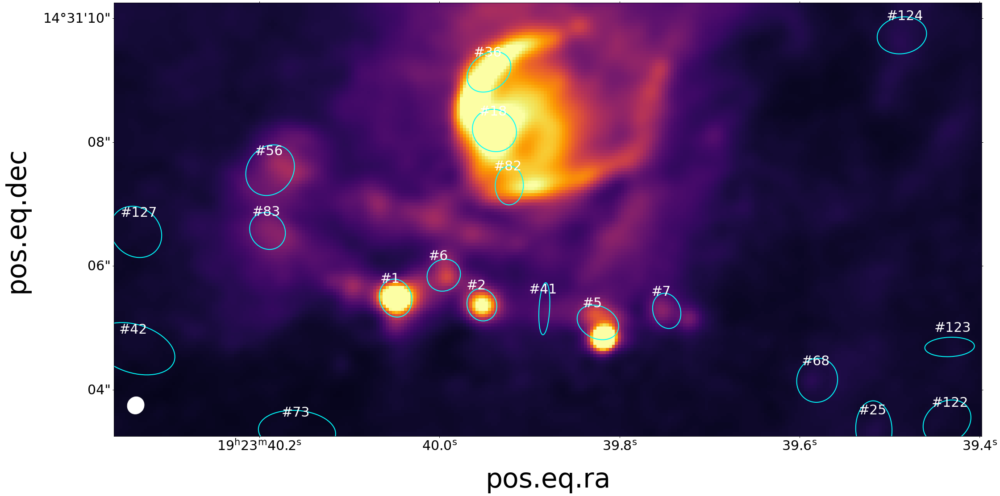

In [3]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

def add_beam(ax,xpos,ypos,beam, pixel_scale,color='w'):
    width = beam.major / pixel_scale
    height = beam.minor /pixel_scale
    angle = beam.pa
    ax.add_patch(Ellipse((xpos,ypos),width.value,height.value,180-angle.value,color=color))

fitsdata_b3 = fits.open(w51n_b3_almaimf)
hdrNB3 = fits.getheader(w51n_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.0014731956296595468,vmax=0.02717668762376916)

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(asize_b3)):
    major = asize_b3[i]/3600/scaleNB3.value
    minor = bsize_b3[i]/3600/scaleNB3.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-theta_b3[i],edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
                 
sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])

#plt.savefig('w51n_almaimf_b3.png')


1.388888888889e-05 deg



(1915.0059708691438, 2055.0052961769825)

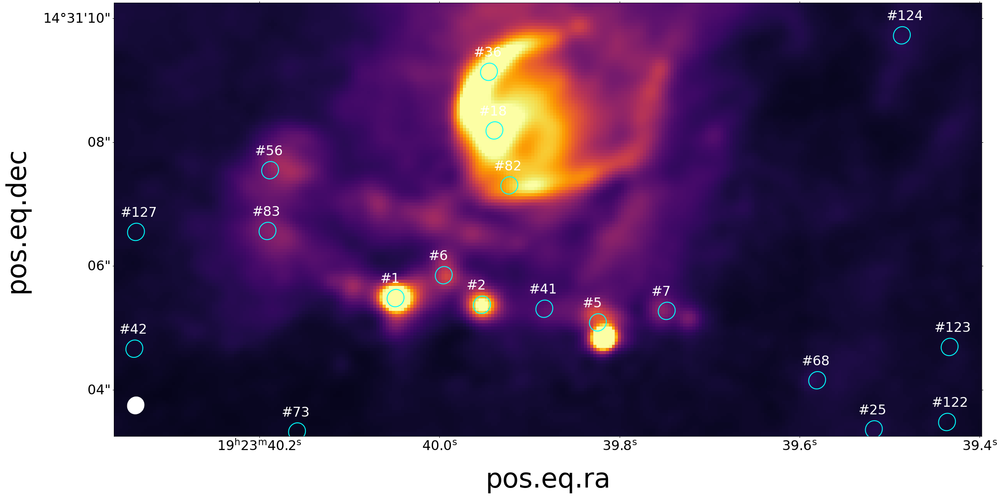

In [4]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

def add_beam(ax,xpos,ypos,beam, pixel_scale,color='w'):
    width = beam.major / pixel_scale
    height = beam.minor /pixel_scale
    angle = beam.pa
    ax.add_patch(Ellipse((xpos,ypos),width.value,height.value,180-angle.value,color=color))

fitsdata_b3 = fits.open(w51n_b3_almaimf)
hdrNB3 = fits.getheader(w51n_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.0014731956296595468,vmax=0.02717668762376916)

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(asize_b3)):
    major = beamNB3.major.value/scaleNB3.value
    minor = beamNB3.minor.value/scaleNB3.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-beamNB3.pa.value,edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
                 
sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])

#plt.savefig('w51n_almaimf_b3.png')


(1915.0059708691438, 2055.0052961769825)

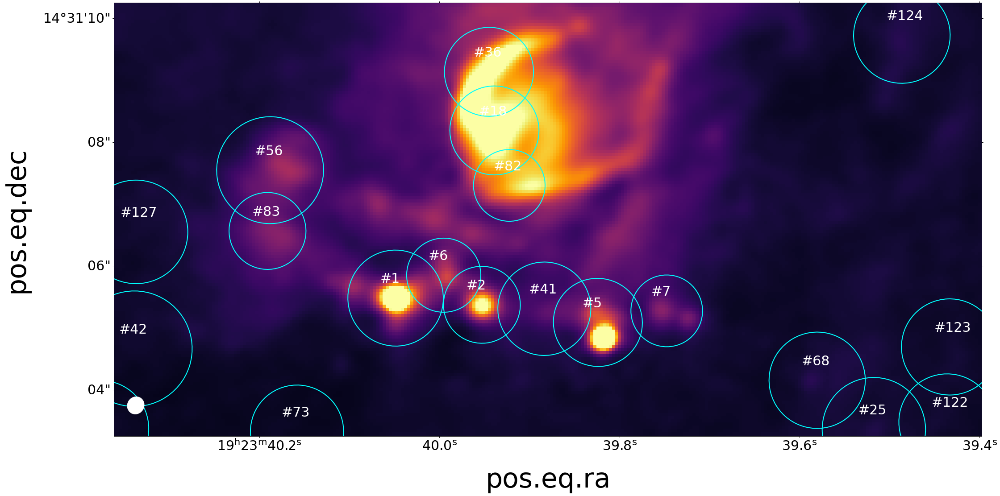

In [5]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

def add_beam(ax,xpos,ypos,beam, pixel_scale,color='w'):
    width = beam.major / pixel_scale
    height = beam.minor /pixel_scale
    angle = beam.pa
    ax.add_patch(Ellipse((xpos,ypos),width.value,height.value,180-angle.value,color=color))

fitsdata_b3 = fits.open(w51n_b3_almaimf)
hdrNB3 = fits.getheader(w51n_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.0014731956296595468,vmax=0.02717668762376916)

pixpos = wcsNB3.wcs_world2pix(skypos,0)

for i in range(len(asize_b3)):
    major = fooa_b3[i]/3600/scaleNB3.value
    minor = foob_b3[i]/3600/scaleNB3.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-theta_b3[i],edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
                 
sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])

#plt.savefig('w51n_almaimf_b3.png')


1.388888888889e-05 deg



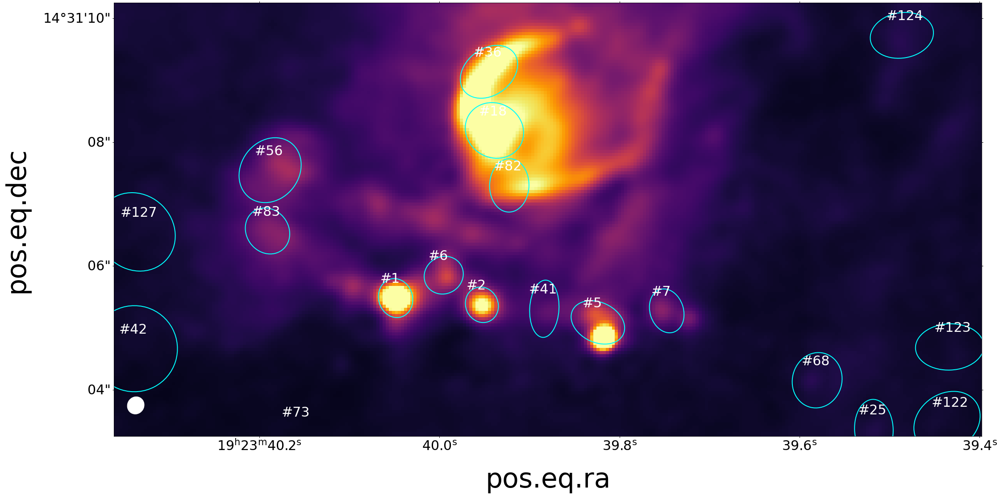

In [6]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b3 = fits.open(w51n_b3_almaimf)
hdrNB3 = fits.getheader(w51n_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.0014731956296595468,vmax=0.02717668762376916)

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(asize_b3)):
    major = afwhm_b3[i]/3600/scaleNB3.value
    minor = bfwhm_b3[i]/3600/scaleNB3.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-theta_b3[i],edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
                 
sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

#plt.savefig('w51n_almaimf_b3.png')


1.388888888889e-05 deg



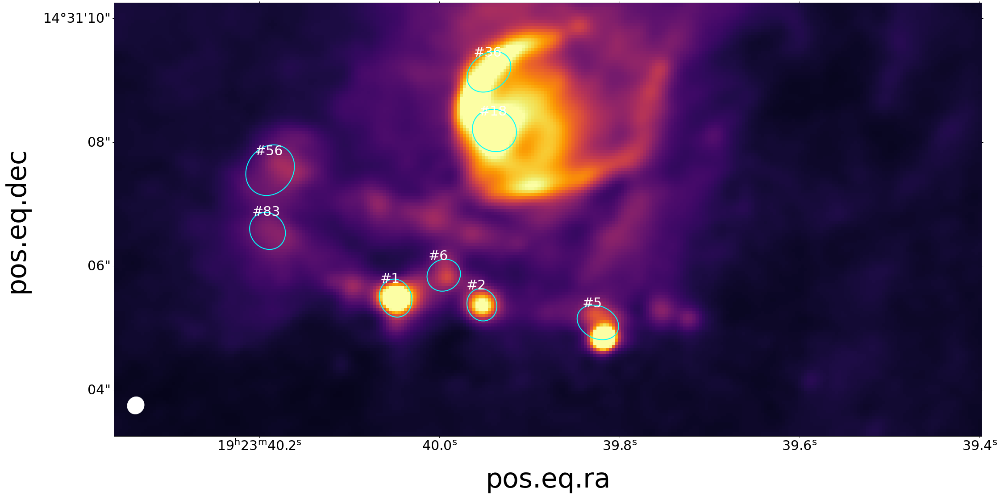

In [7]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b3 = fits.open(w51n_b3_almaimf)
hdrNB3 = fits.getheader(w51n_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.0014731956296595468,vmax=0.02717668762376916)

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(rec_ind_b3)):
    major = asize_b3[rec_ind_b3][i]/3600/scaleNB3.value
    minor = bsize_b3[rec_ind_b3][i]/3600/scaleNB3.value

    ellipse = Ellipse(pixpos[rec_ind_b3][i],width=major,height=minor,facecolor='none',angle=theta_b3[rec_ind_b3][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b3][i][0]-5,pixpos[rec_ind_b3][i][1]+5,"#%d"%no[rec_ind_b3][i],color='w',clip_on=True,fontsize=30)
                 
sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)




plt.savefig('w51n_almaimf_b3.png')
plt.show()


(array(479.9099524), array(563.69215943)) (array(619.91035597), array(633.69182208))


(563.6921594298096, 633.6918220815455)

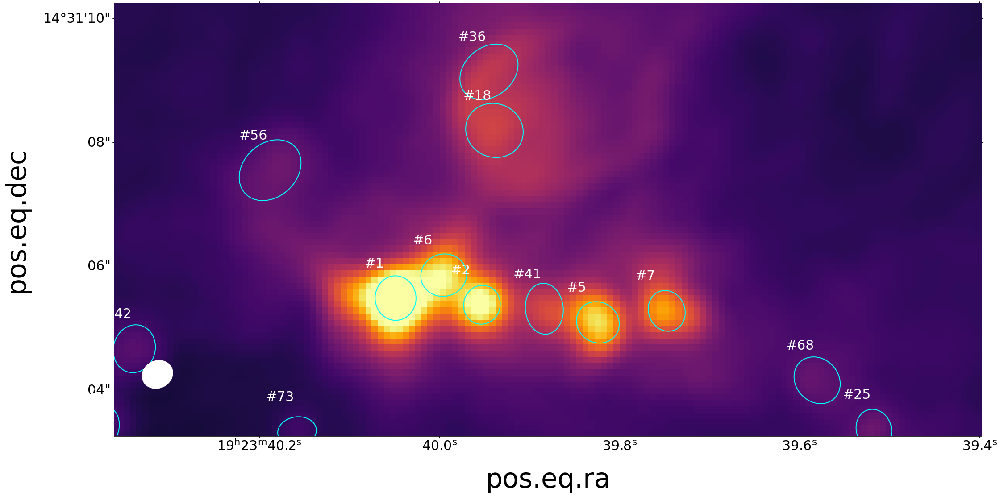

In [8]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51n_b6_almaimf)
hdrNB6 = fits.getheader(w51n_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=-0.0030192469712346792,vmax=0.32465317))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(rec_ind_b6)):
    major = afwhm_b6[rec_ind_b6][i]/3600/scaleNB6.value
    minor = bfwhm_b6[rec_ind_b6][i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[rec_ind_b6][i],width=major,height=minor,facecolor='none',angle=theta_b6[rec_ind_b6][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b6][i][0]-5,pixpos[rec_ind_b6][i][1]+5,"#%d"%no[rec_ind_b6][i],color='w',clip_on=True,fontsize=30)

sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB6.world_to_pixel(sky1)
pix2 = wcsNB6.world_to_pixel(sky2)
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB6, scaleNB6)
print(pix1,pix2)
ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])




(563.6921594298096, 633.6918220815455)

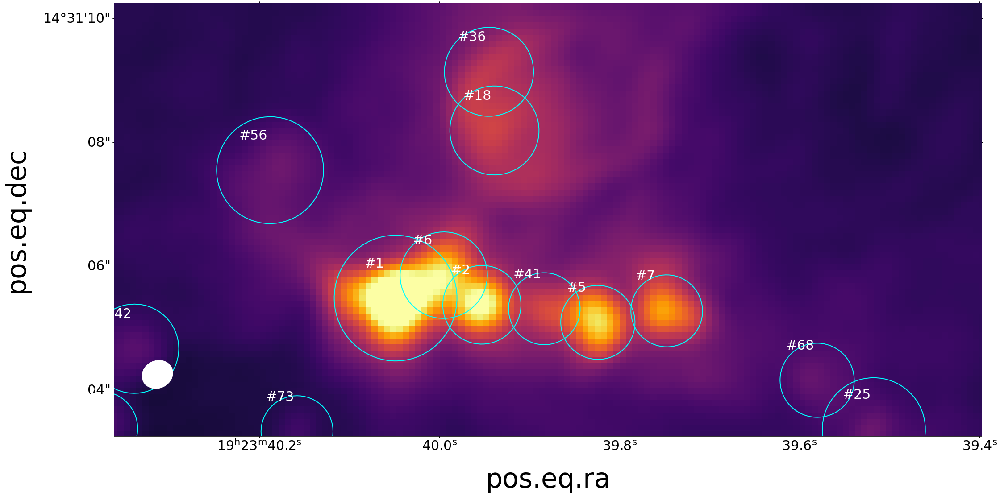

In [10]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51n_b6_almaimf)
hdrNB6 = fits.getheader(w51n_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=-0.0030192469712346792,vmax=0.32465317))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(rec_ind_b6)):
    major = fooa_b6[rec_ind_b6][i]/3600/scaleNB6.value
    minor = foob_b6[rec_ind_b6][i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[rec_ind_b6][i],width=major,height=minor,facecolor='none',angle=theta_b6[rec_ind_b6][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b6][i][0]-5,pixpos[rec_ind_b6][i][1]+5,"#%d"%no[rec_ind_b6][i],color='w',clip_on=True,fontsize=30)

sky1 = coordinates.SkyCoord(290.9181731, 14.51756944, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.91415592, 14.51951388, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB6.world_to_pixel(sky1)
pix2 = wcsNB6.world_to_pixel(sky2)
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB6, scaleNB6)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])



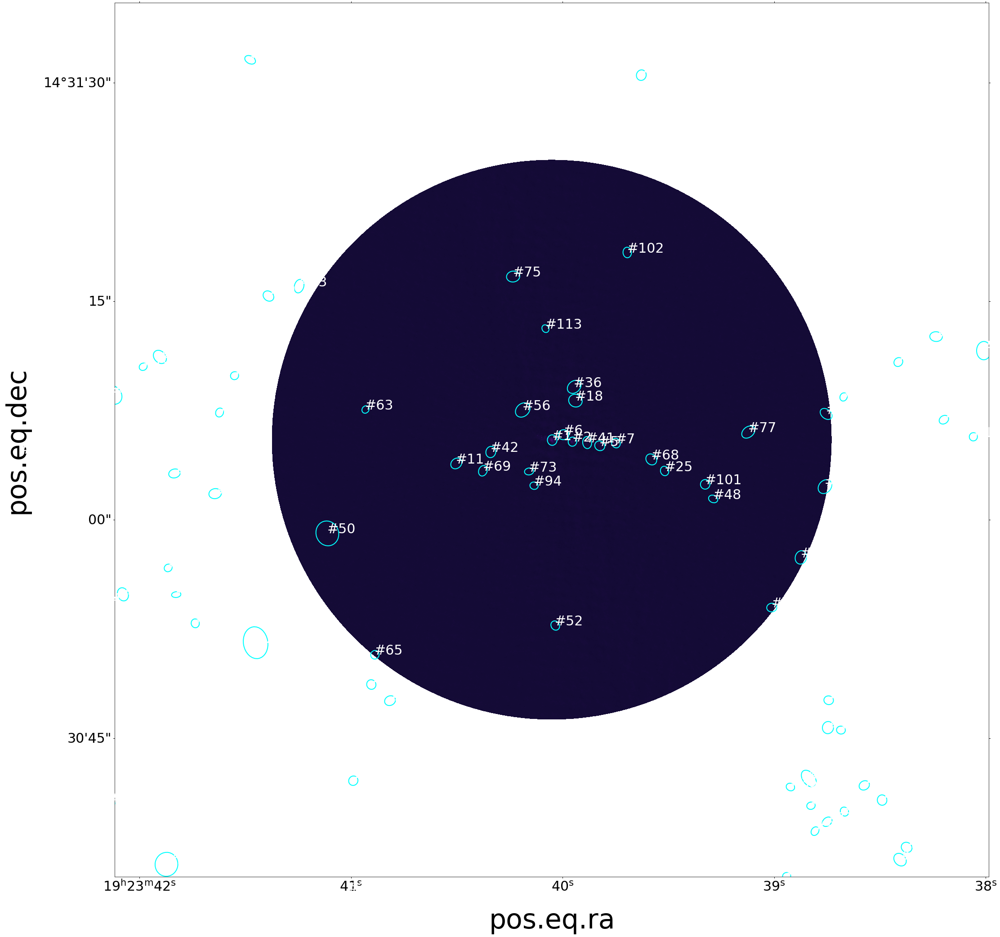

In [11]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51n_b6_briggs)
hdrNB6 = fits.getheader(w51n_b6_briggs)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=-0.0030192469712346792,vmax=0.32465317))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(rec_ind_b6)):
    major = afwhm_b6[rec_ind_b6][i]/3600/scaleNB6.value
    minor = bfwhm_b6[rec_ind_b6][i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[rec_ind_b6][i],width=major,height=minor,facecolor='none',angle=theta_b6[rec_ind_b6][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b6][i][0]-5,pixpos[rec_ind_b6][i][1]+5,"#%d"%no[rec_ind_b6][i],color='w',clip_on=True,fontsize=30)




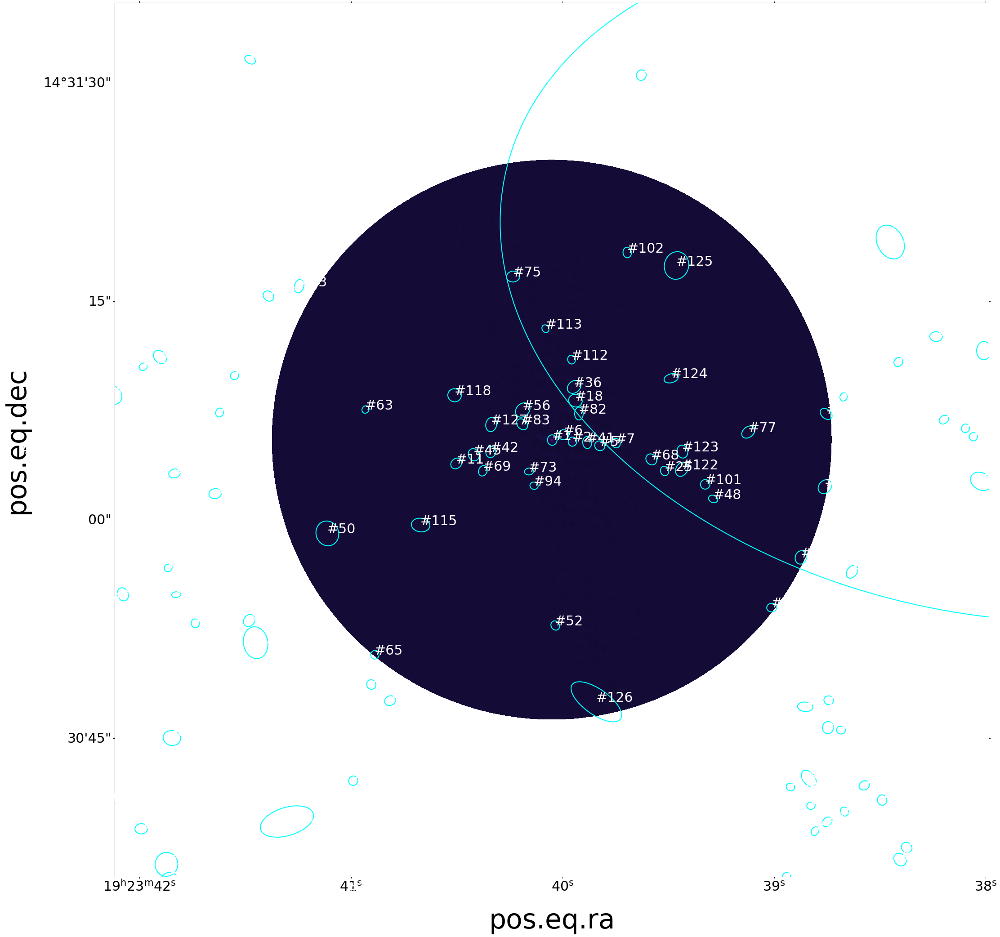

In [12]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51n_b6_briggs)
hdrNB6 = fits.getheader(w51n_b6_briggs)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=-0.0030192469712346792,vmax=0.32465317))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(afwhm_b6)):
    major = afwhm_b6[i]/3600/scaleNB6.value
    minor = bfwhm_b6[i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=theta_b6[i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)




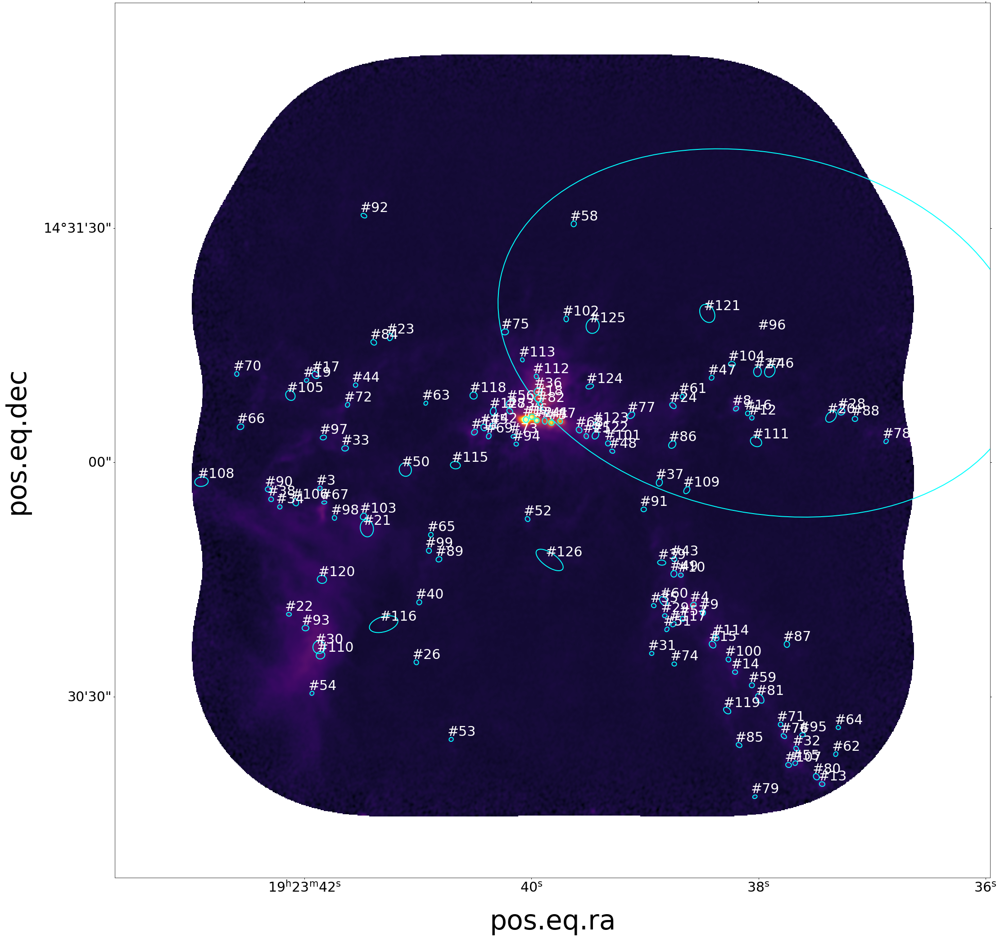

In [13]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51n_b6_almaimf)
hdrNB6 = fits.getheader(w51n_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=-0.0030192469712346792,vmax=0.32465317))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(afwhm_b6)):
    major = afwhm_b6[i]/3600/scaleNB6.value
    minor = bfwhm_b6[i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=theta_b6[i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)




In [14]:

catdata_w51e = ascii.read(cat_w51e,data_start=0,format='commented_header', header_start=120,  comment="!")
sky_ra = catdata_w51e['WCS_ACOOR']
sky_dec = catdata_w51e['WCS_DCOOR']
pix_x = catdata_w51e['XCO_P']
pix_y = catdata_w51e['YCO_P']

afwhm_b6 = catdata_w51e['AFWHM02']
bfwhm_b6 = catdata_w51e['BFWHM02']

asize_b6 = catdata_w51e['ASIZE02']
bsize_b6 = catdata_w51e['BSIZE02']

theta_b6 = catdata_w51e['THETA02']

afwhm_b3 = catdata_w51e['AFWHM03']
bfwhm_b3 = catdata_w51e['BFWHM03']

asize_b3 = catdata_w51e['ASIZE03']
bsize_b3 = catdata_w51e['BSIZE03']

theta_b3 = catdata_w51e['THETA03']
no = catdata_w51e['NO']

rec_ind_b3 = np.where((np.abs(catdata_w51e['GOODM03'])>1)&
                   (np.abs(catdata_w51e['SIGNM03'])>1)&
                   (catdata_w51e['FXP_BST03']/catdata_w51e['FXP_ERR03']>2)&
                   (catdata_w51e['FXT_BST03']/catdata_w51e['FXT_ERR03']>2)&
                   (catdata_w51e['AFWHM03']/catdata_w51e['BFWHM03']<2)&
                   (catdata_w51e['FOOA03']/catdata_w51e['AFWHM03']>1.15))[0]

rec_ind_b6 = np.where((np.abs(catdata_w51e['GOODM02'])>1)&
                   (np.abs(catdata_w51e['SIGNM02'])>1)&
                   (catdata_w51e['FXP_BST02']/catdata_w51e['FXP_ERR02']>2)&
                   (catdata_w51e['FXT_BST02']/catdata_w51e['FXT_ERR02']>2)&
                   (catdata_w51e['AFWHM02']/catdata_w51e['BFWHM02']<2)&
                   (catdata_w51e['FOOA02']/catdata_w51e['AFWHM02']>1.15))[0]
rec_ind = np.where((np.abs(catdata_w51e['GOODM03'])>1)&
                   (np.abs(catdata_w51e['SIGNM03'])>1)&
                   (catdata_w51e['FXP_BST03']/catdata_w51e['FXP_ERR03']>2)&
                   (catdata_w51e['FXT_BST03']/catdata_w51e['FXT_ERR03']>2)&
                   (catdata_w51e['AFWHM03']/catdata_w51e['BFWHM03']<2)&
                   (catdata_w51e['FOOA03']/catdata_w51e['AFWHM03']>1.15) &
                   (np.abs(catdata_w51e['GOODM02'])>1) &
                   (np.abs(catdata_w51e['SIGNM02'])>1)&
                   (catdata_w51e['FXP_BST02']/catdata_w51e['FXP_ERR02']>2)&
                   (catdata_w51e['FXT_BST02']/catdata_w51e['FXT_ERR02']>2)&
                   (catdata_w51e['AFWHM02']/catdata_w51e['BFWHM02']<2)&
                   (catdata_w51e['FOOA02']/catdata_w51e['AFWHM02']>1.15))[0]

print(rec_ind_b3)



skypos = np.vstack((sky_ra,sky_dec)).T






[ 0  1  2  3  4  5  6  7  8  9 11 12 13 16 18 22 24 26 27 31 35]


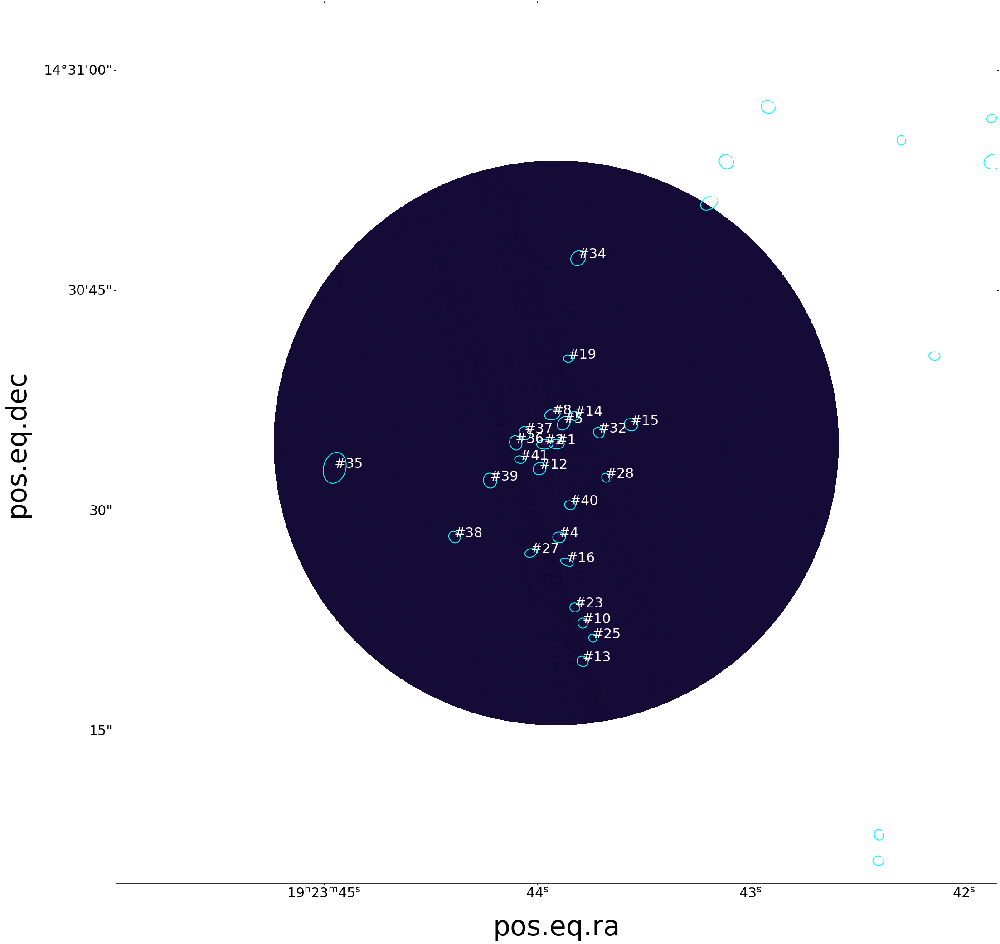

In [15]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51e_b6_briggs)
hdrNB6 = fits.getheader(w51e_b6_briggs)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=-0.0030192469712346792,vmax=0.32465317))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(afwhm_b6)):
    major = afwhm_b6[i]/3600/scaleNB6.value
    minor = bfwhm_b6[i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=theta_b6[i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)




In [16]:
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse
from functools import reduce

def log_forward(arr):
    return np.log10(1000*arr+1)/np.log10(1001)
def log_backward(arr):
    return (1001**arr-1)/1000
def count_points_in_ellipse(xcen,ycen,major,minor,pa,xpos,ypos):
    # caclulate foci positions 
    # must be full major, minor not semi major, minor
    fodx = np.cos(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    fody = np.sin(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    
    fox1 = xcen + fodx
    foy1 = ycen + fody
    
    fox2 = xcen - fodx
    foy2 = ycen - fody
    
    dist1 = np.sqrt((xpos-fox1)**2+(ypos-foy1)**2)
    dist2 = np.sqrt((xpos-fox2)**2+(ypos-foy2)**2)
    
    isinside = np.where(dist1+dist2<major)[0]
    
    return len(isinside), isinside

def count_source_in_image(image, xpix, ypix, kind='center'):
    nsource = len(xpix)
    isinside = []
    if kind is 'center':
        for i in range(nsource):
            if xpix[i] > image.shape[1] or ypix[i] > image.shape[0]:
                continue
            if np.isfinite(image[int(xpix[i]),int(ypix[i])]):
                isinside.append(i)
    return isinside

def plot_aperture_on_image(ax, data, catdata, beam_lr=None, label=None, band='b3', aperture='fwhm+beam', 
                           use_criteria=False, limitarea=None,vmin=-0.00110023576011658, vmax=0.008559992119315504,norm=None,
                          plot_ellipse_only=False,color='cyan',text=True):
    
    fitsdata = fits.open(data)
    hdrNB = fits.getheader(data)  
    wcsNB = WCS(hdrNB,naxis=2)
    scaleNB = wcsNB.proj_plane_pixel_scales()[0]

    beamNB = Beam.from_fits_header(hdrNB)

    if not plot_ellipse_only:
        if len(fitsdata[0].data.shape)!=2:
            imageb3 = fitsdata[0].data[0][0]
        else:
            imageb3 = fitsdata[0].data
        if norm=='sqrt':
            ax.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),
                      norm=colors.PowerNorm(gamma=0.5,vmin=vmin,vmax=vmax))
        elif norm=='log':
            ax.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),
                      norm=colors.FuncNorm(functions=(log_forward,log_backward),vmin=vmin,vmax=vmax))
        else:
            ax.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=vmin,vmax=vmax)
    
    if band == 'b3':
        bandindex = 3
    elif band == 'b6':
        bandindex = 2
    catdata_w51 = ascii.read(catdata,data_start=0,format='commented_header', header_start=120,  comment="!")
    sky_ra = catdata_w51['WCS_ACOOR']
    sky_dec = catdata_w51['WCS_DCOOR']
    no = catdata_w51['NO']
    afwhm= catdata_w51['AFWHM0%d'%bandindex]
    bfwhm = catdata_w51['BFWHM0%d'%bandindex]
    fooa = catdata_w51['FOOA0%s'%bandindex]
    foob = catdata_w51['FOOB0%s'%bandindex]
    theta = catdata_w51['THETA0%s'%bandindex]
    print('afwhm',afwhm)
    
    ncat = len(no)
    
    if use_criteria:
        rec_ind = np.where((np.abs(catdata['GOODM%s'%bandlabel])>1)&
                   (np.abs(catdata['SIGNM%s'%bandlabel])>1)&
                   (catdata['FXP_BST%s'%bandlabel]/catdata['FXP_ERR%s'%bandlabel]>2)&
                   (catdata['FXT_BST%s'%bandlabel]/catdata['FXT_ERR%s'%bandlabel]>2)&
                   (catdata['AFWHM%s'%bandlabel]/catdata['BFWHM%s'%bandlabel]<2)&
                   (catdata['FOOA%s'%bandlabel]/catdata['AFWHM%s'%bandlabel]>1.15))[0]
    else: 
        rec_ind = np.arange(ncat)
        
    
    if label is None:
        label = np.arange(ncat)
        
    
    elif limitarea is not None:
        
        posind = np.where((sky_ra>limitarea[0])&(sky_ra<limitarea[1])&
                          (sky_dec>limitarea[2])&(sky_dec<limitarea[3]))[0]
    else:
        posind = np.arange(ncat)
    print(rec_ind)
    print('label',label)
    print(posind)
    totalind = reduce(np.intersect1d, (rec_ind, label, posind))  
    print('ttoalind',totalind)    
    sky_ra = sky_ra[totalind]
    sky_dec = sky_dec[totalind]
    fooa = fooa[totalind]
    foob = foob[totalind]
    theta = theta[totalind]
    no = no[totalind]
    afwhm =afwhm[totalind]
    bfwhm = bfwhm[totalind]
    skypos = np.vstack((sky_ra,sky_dec)).T
    pixpos = wcsNB3.wcs_world2pix(skypos,0)
    
    if aperture is 'footprint':
        major = fooa/3600
        minor = foob/3600
        pa = 180-theta
    elif aperture is 'fwhm+beam':
        meanbeamsize = (beam_lr.major.value+beam_lr.minor.value)/4
        major = (afwhm/3600+meanbeamsize/3600)
        minor = (bfwhm/3600+meanbeamsize/3600)
        pa = 180-theta
    elif aperture is 'beam':
        major = beam_lr.major.value
        minor = beam_lr.minor.value
        pa = 180-beam_lr.pa.value


    
    for i in range(len(totalind)):
         
        ellipse = Ellipse(pixpos[i],width=major[i]/scaleNB.value,height=minor[i]/scaleNB.value,facecolor='none',angle=180-pa[i],edgecolor=color,lw=2)
        ax1.add_patch(ellipse)
        if text:
            ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
        
        

### apertures on w51e B3 almaimf

afwhm AFWHM03
-------
 0.5796
 0.8121
 0.6051
 0.7192
 0.7451
 0.5554
  2.775
    1.0
 0.7778
 0.6504
 0.8496
 0.9292
 0.6144
 0.6724
 0.9469
    ...
  2.157
 0.5617
 0.6105
  1.371
 0.5977
  1.321
 0.6413
  1.081
  2.429
  1.914
 0.8413
  1.098
  1.197
  1.554
  1.145
  0.918
Length = 41 rows
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]
label [0, 1, 3, 4, 7, 9, 11, 12, 13, 14, 15, 18, 22, 24, 26, 27, 31, 33, 34, 35, 36, 37, 38, 39, 40]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]
ttoalind [ 0  1  3  4  7  9 11 12 13 14 15 18 22 24 26 27 31 33 34 35 36 37 38 39
 40]
afwhm AFWHM03
-------
 0.5796
 0.8121
 0.6051
 0.7192
 0.7451
 0.5554
  2.775
    1.0
 0.7778
 0.6504
 0.8496
 0.9292
 0.6144
 0.6724
 0.9469
    ...
  2.157
 0.5617
 0.6105
  1.371
 0.5977
  1.321
 0.6413
  1.081
  2.429
  1.914
 0.8413
  1.098
  1.197
  1.554
  1

(2022.6717074975759, 3049.3434239256785)

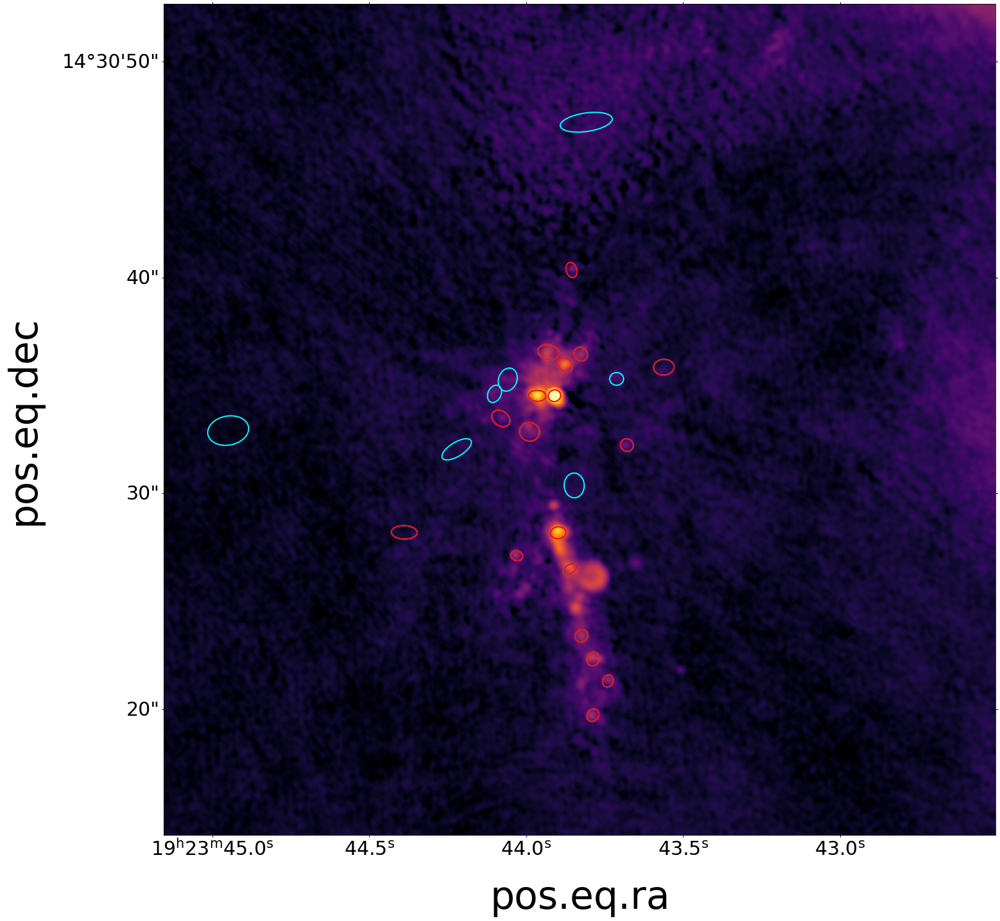

In [17]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60

#get the indices of sources within the smallest FoV (overlapped)
fitsdata = fits.open(w51e_b6_briggs)
b6highresimage = fitsdata[0].data[0][0]
hdrNBb6 = fits.getheader(w51e_b6_briggs)
wcsNBb6 = WCS(hdrNBb6,naxis=2)
xysky = np.vstack((sky_ra, sky_dec)).T
pixxy_b6 = wcsNBb6.wcs_world2pix(xysky,0)
ind_inside_b6image = count_source_in_image(b6highresimage, pixxy_b6[:,0], pixxy_b6[:,1])

skylim1 = wcsNBb6.pixel_to_world(2150,2150)
skylim2 = wcsNBb6.pixel_to_world(9850,9850)

hdrNB3 = fits.getheader(w51e_b3_almaimf_conv)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)

hdrNB3 = fits.getheader(w51e_b3_almaimf_conv)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [1, 2, 4, 5, 8, 10, 12, 13, 14, 15, 16, 19, 23, 25, 27, 28,38, 41]
w51e_b3_index = [i-1 for i in manualindex]


plot_aperture_on_image(ax1, w51e_b3_almaimf_conv, cat_w51e, beam_lr=beamNB3_almaimf, label=ind_inside_b6image,text=False, norm='log',vmin=-0.0003,vmax=0.1295288363103794)

plot_aperture_on_image(ax1, w51e_b3_almaimf_conv, cat_w51e, beam_lr=beamNB3_almaimf, label=w51e_b3_index,plot_ellipse_only=True,color='r',text=False)

lim1 = wcsNB3.world_to_pixel(skylim1)
lim2 = wcsNB3.world_to_pixel(skylim2)
ax1.set_ylim(lim1[0],lim2[0])
ax1.set_xlim(lim1[1],lim2[1])




### apertures on w51e B6 almaimf

afwhm AFWHM02
-------
   1.04
  1.107
 0.6619
  0.851
  1.021
 0.7031
  2.953
  1.067
 0.8622
  0.686
 0.7876
 0.8948
 0.7744
 0.6535
 0.9225
    ...
  1.466
 0.8192
 0.6297
  1.016
 0.6532
 0.9634
 0.7763
  0.738
  1.077
  2.143
 0.9944
 0.9191
 0.8434
  1.025
 0.7459
 0.7421
Length = 41 rows
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]
label [0, 1, 3, 4, 7, 9, 11, 12, 13, 14, 15, 18, 22, 24, 26, 27, 31, 33, 34, 35, 36, 37, 38, 39, 40]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]
ttoalind [ 0  1  3  4  7  9 11 12 13 14 15 18 22 24 26 27 31 33 34 35 36 37 38 39
 40]
afwhm AFWHM02
-------
   1.04
  1.107
 0.6619
  0.851
  1.021
 0.7031
  2.953
  1.067
 0.8622
  0.686
 0.7876
 0.8948
 0.7744
 0.6535
 0.9225
    ...
  1.466
 0.8192
 0.6297
  1.016
 0.6532
 0.9634
 0.7763
  0.738
  1.077
  2.143
 0.9944
 0.9191
 0.8434
  1.025
 0.

(734.4851071345291, 1376.1549298146408)

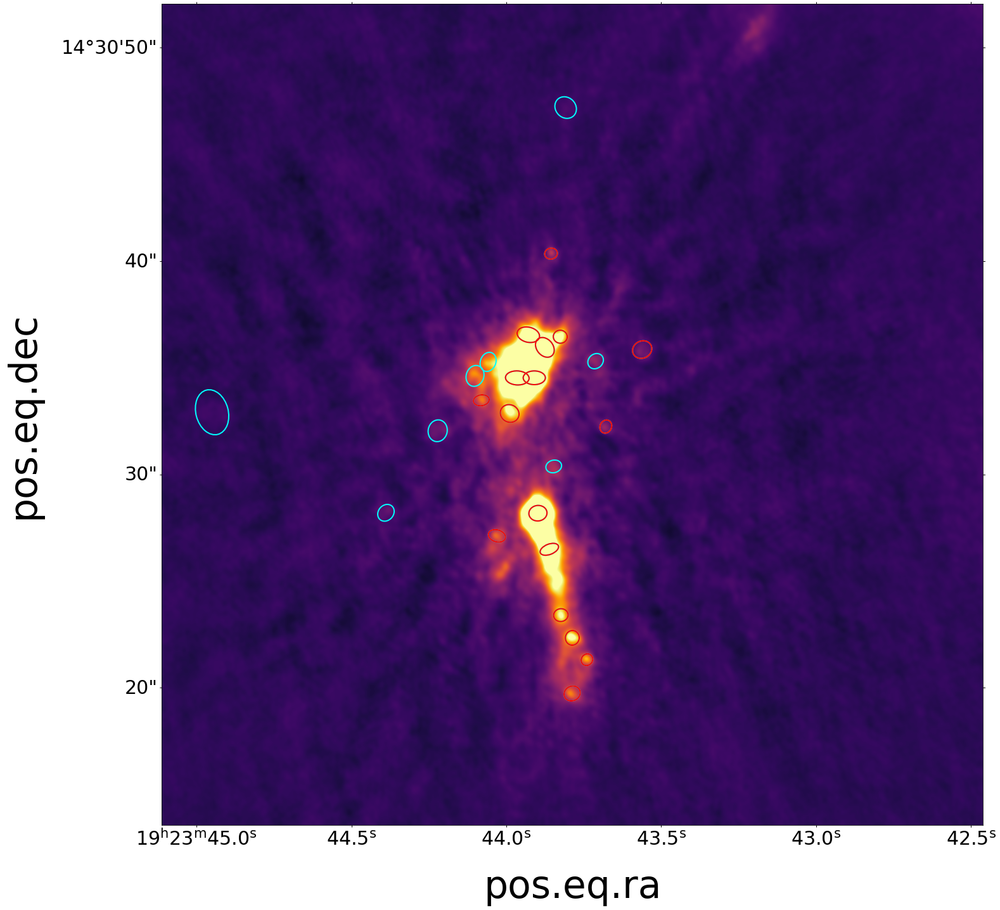

In [18]:
fitsdata = fits.open(w51e_b6_briggs)
b6highresimage = fitsdata[0].data[0][0]
hdrNBb6 = fits.getheader(w51e_b6_briggs)
wcsNBb6 = WCS(hdrNBb6,naxis=2)
xysky = np.vstack((sky_ra, sky_dec)).T
pixxy_b6 = wcsNBb6.wcs_world2pix(xysky,0)
ind_inside_b6image = count_source_in_image(b6highresimage, pixxy_b6[:,0], pixxy_b6[:,1])
skylim1 = wcsNBb6.pixel_to_world(2150,2150)
skylim2 = wcsNBb6.pixel_to_world(9850,9850)

hdrNB3 = fits.getheader(w51e_b6_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)

hdrNB3 = fits.getheader(w51e_b6_almaimf)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [1, 2, 4, 5, 8, 10, 12, 13, 14, 15, 16, 19, 23, 25, 27, 28, 41]
w51e_b3_index = [i-1 for i in manualindex]


plot_aperture_on_image(ax1, w51e_b6_almaimf, cat_w51e, band='b6',beam_lr=beamNB3_almaimf, label=ind_inside_b6image,text=False, vmin=-0.006853682920336723,vmax=0.03775018166358015)

plot_aperture_on_image(ax1, w51e_b6_almaimf, cat_w51e, band='b6',beam_lr=beamNB3_almaimf, label=w51e_b3_index,plot_ellipse_only=True,color='r',text=False)

lim1 = wcsNB3.world_to_pixel(skylim1)
lim2 = wcsNB3.world_to_pixel(skylim2)
ax1.set_ylim(lim1[0],lim2[0])
ax1.set_xlim(lim1[1],lim2[1])

### w51n b6

afwhm AFWHM02
-------
 0.7192
 0.6299
 0.5573
 0.7387
 0.7083
 0.7426
 0.6672
 0.6911
  0.712
 0.6055
 0.8211
 0.5678
 0.7099
 0.6515
 0.9509
    ...
 0.6067
   0.55
 0.7605
  1.275
  3.776
 0.7532
 0.9308
  1.035
  1.202
  2.447
   1.04
 0.8979
  1.005
   1.91
  4.072
 0.9821
Length = 127 rows
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126]
label [0, 1, 4, 5, 6, 10, 17, 23, 24, 35, 36, 40, 41, 44, 47, 49, 51, 55, 62, 64, 67, 68, 72, 74, 76, 81, 82, 85, 90, 93, 100, 101, 111, 112, 114, 117, 121, 122, 123, 124, 125, 126]
[  0 

(393.69283487364464, 778.6911504228506)

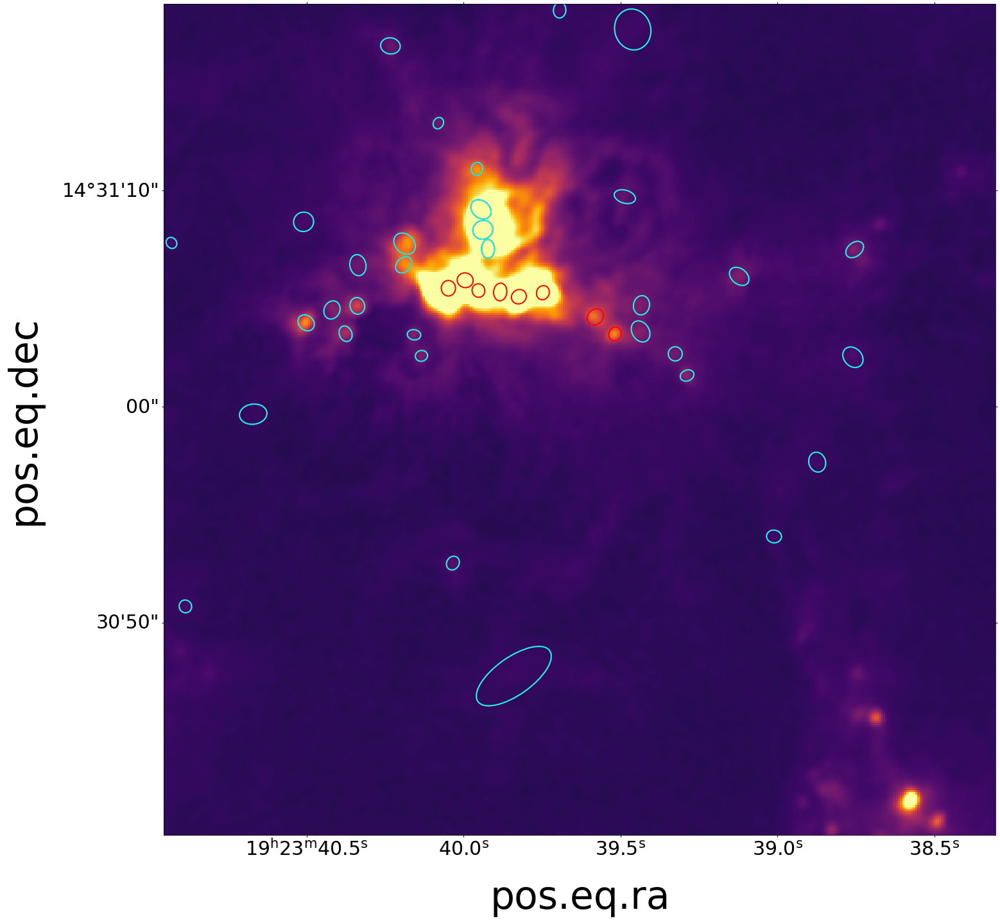

In [19]:
class catdata():
    def __init__(self,catfile,band='B3'):
        catdata_w51e = ascii.read(catfile,data_start=0,format='commented_header', header_start=120,  comment="!")
        self.sky_ra = catdata_w51e['WCS_ACOOR']
        self.sky_dec = catdata_w51e['WCS_DCOOR']
        self.pix_x = catdata_w51e['XCO_P']
        self.pix_y = catdata_w51e['YCO_P']
        
        if band=='B3':
            bandind = 3
        else:
            bandind = 2

        self.afwhm = catdata_w51e['AFWHM0%d'%bandind]
        self.bfwhm = catdata_w51e['BFWHM0%d'%bandind]

        self.asize = catdata_w51e['ASIZE0%d'%bandind]
        self.bsize = catdata_w51e['BSIZE0%d'%bandind]

        self.theta = catdata_w51e['THETA0%d'%bandind]

       
        self.no = catdata_w51e['NO']

        self.rec_ind_b3 = np.where((np.abs(catdata_w51e['GOODM03'])>1)&
                           (np.abs(catdata_w51e['SIGNM03'])>1)&
                           (catdata_w51e['FXP_BST03']/catdata_w51e['FXP_ERR03']>2)&
                           (catdata_w51e['FXT_BST03']/catdata_w51e['FXT_ERR03']>2)&
                           (catdata_w51e['AFWHM03']/catdata_w51e['BFWHM03']<2)&
                           (catdata_w51e['FOOA03']/catdata_w51e['AFWHM03']>1.15))[0]

        self.rec_ind_b6 = np.where((np.abs(catdata_w51e['GOODM02'])>1)&
                           (np.abs(catdata_w51e['SIGNM02'])>1)&
                           (catdata_w51e['FXP_BST02']/catdata_w51e['FXP_ERR02']>2)&
                           (catdata_w51e['FXT_BST02']/catdata_w51e['FXT_ERR02']>2)&
                           (catdata_w51e['AFWHM02']/catdata_w51e['BFWHM02']<2)&
                           (catdata_w51e['FOOA02']/catdata_w51e['AFWHM02']>1.15))[0]
        self.rec_ind = np.where((np.abs(catdata_w51e['GOODM03'])>1)&
                           (np.abs(catdata_w51e['SIGNM03'])>1)&
                           (catdata_w51e['FXP_BST03']/catdata_w51e['FXP_ERR03']>2)&
                           (catdata_w51e['FXT_BST03']/catdata_w51e['FXT_ERR03']>2)&
                           (catdata_w51e['AFWHM03']/catdata_w51e['BFWHM03']<2)&
                           (catdata_w51e['FOOA03']/catdata_w51e['AFWHM03']>1.15) &
                           (np.abs(catdata_w51e['GOODM02'])>1) &
                           (np.abs(catdata_w51e['SIGNM02'])>1)&
                           (catdata_w51e['FXP_BST02']/catdata_w51e['FXP_ERR02']>2)&
                           (catdata_w51e['FXT_BST02']/catdata_w51e['FXT_ERR02']>2)&
                           (catdata_w51e['AFWHM02']/catdata_w51e['BFWHM02']<2)&
                           (catdata_w51e['FOOA02']/catdata_w51e['AFWHM02']>1.15))[0]
catw51n = catdata(cat_w51n,band='B6')
fitsdata = fits.open(w51n_b6_briggs)
b6highresimage = fitsdata[0].data[0][0]
hdrNBb6 = fits.getheader(w51n_b6_briggs)
wcsNBb6 = WCS(hdrNBb6,naxis=2)
xysky = np.vstack((catw51n.sky_ra, catw51n.sky_dec)).T
pixxy_b6 = wcsNBb6.wcs_world2pix(xysky,0)
ind_inside_b6image = count_source_in_image(b6highresimage, pixxy_b6[:,0], pixxy_b6[:,1])
skylim1 = wcsNBb6.pixel_to_world(2150,2150)
skylim2 = wcsNBb6.pixel_to_world(9850,9850)

hdrNB3 = fits.getheader(w51n_b6_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)

hdrNB3 = fits.getheader(w51n_b6_almaimf)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [11, 18, 24, 36, 37, 42, 45, 48, 50, 52, 56, 63, 65, 69, 73, 75, 77, 82, 83, 86, 91, 94, 101, 102, 112, 113, 115, 118, 122, 123, 124, 125, 126, 127]
w51e_b3_index = [i-1 for i in manualindex]


plot_aperture_on_image(ax1, w51n_b6_almaimf, cat_w51n, band='b6',beam_lr=beamNB3_almaimf, label=ind_inside_b6image,text=False, color='r',vmin=-0.006853682920336723,vmax=0.03775018166358015)

plot_aperture_on_image(ax1, w51n_b6_almaimf, cat_w51n, band='b6',beam_lr=beamNB3_almaimf, label=w51e_b3_index,plot_ellipse_only=True,color='cyan',text=False)

lim1 = wcsNB3.world_to_pixel(skylim1)
lim2 = wcsNB3.world_to_pixel(skylim2)
ax1.set_ylim(lim1[0],lim2[0])
ax1.set_xlim(lim1[1],lim2[1])

TypeError: plot_aperture_on_image() got an unexpected keyword argument 'index'

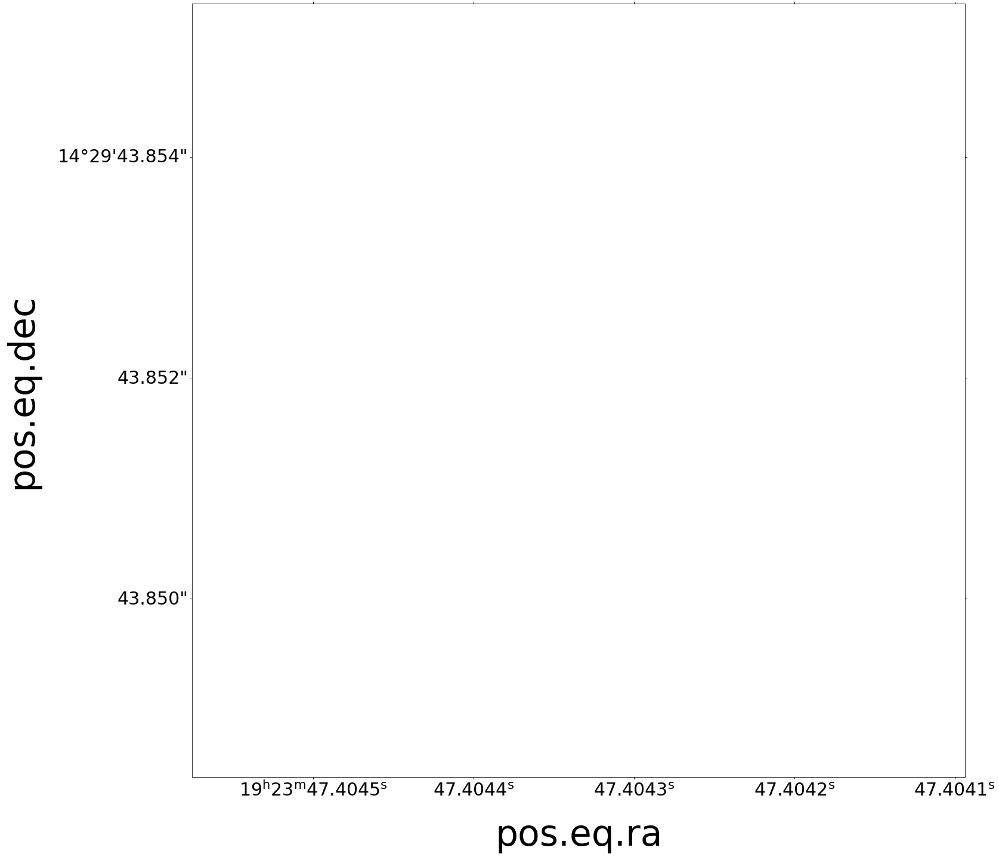

In [20]:
hdrNB3 = fits.getheader(w51e2_b3_tt0)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)


hdrNB3 = fits.getheader(w51e_b3_almaimf)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [1, 2, 4, 5, 8, 10, 12, 13, 14, 15, 16, 19, 23, 25, 27, 28, 38, 41]
w51e_b3_index = [i-1 for i in manualindex]
plot_aperture_on_image(ax1, w51e2_b3_tt0, cat_w51e, beam_lr=beamNB3_almaimf, index=w51e_b3_index,
                    vmin=-0.0001090,vmax=0.001388935)
ax1.set_xlim(6400,8300)
ax1.set_ylim(4600,8300)



TypeError: plot_aperture_on_image() got an unexpected keyword argument 'index'

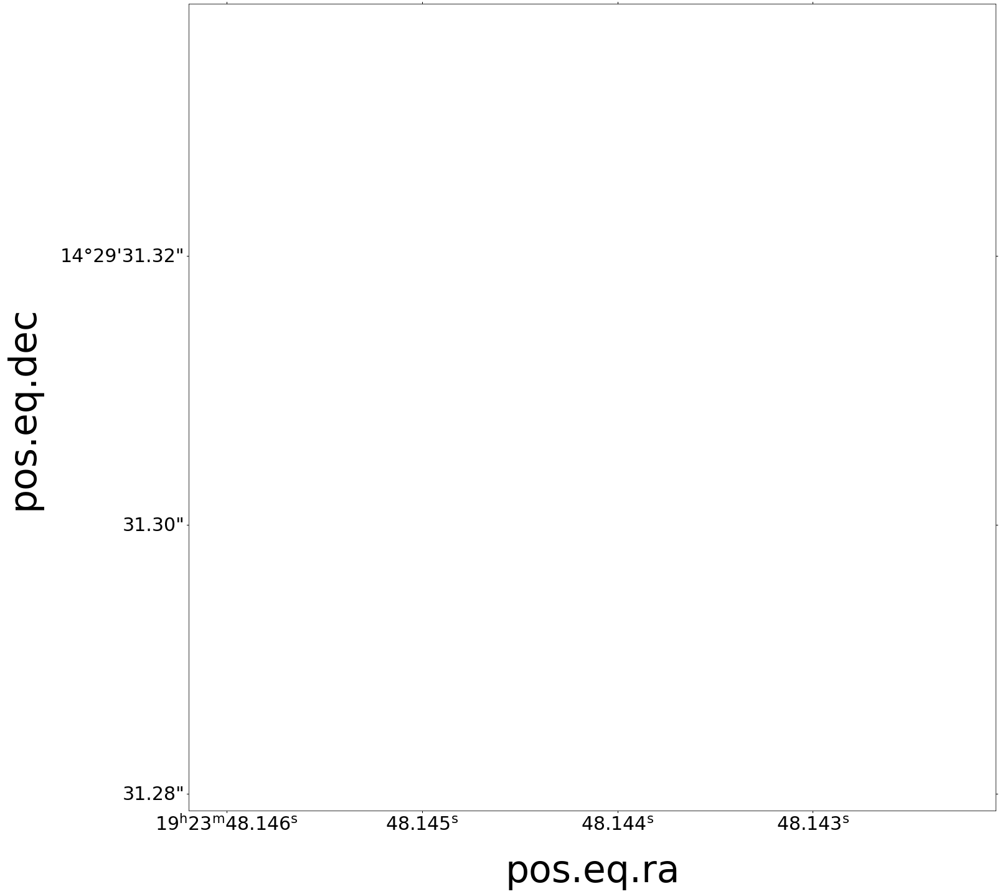

In [21]:
hdrNB3 = fits.getheader(w51e_b6_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)


hdrNB3 = fits.getheader(w51e_b6_almaimf)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [1, 2, 4, 5, 8, 10, 12, 13, 14, 15, 16, 19, 23, 25, 27, 28, 41]
w51e_b6_index = [i-1 for i in manualindex]
plot_aperture_on_image(ax1, w51e_b6_almaimf_conv, cat_w51e, beam_lr=beamNB3_almaimf, index=w51e_b6_index,
                      vmin=1e-3,vmax=0.1,norm='log')
ax1.set_xlim(900,1200)
ax1.set_ylim(750,1150)


In [ ]:
hdrNB3 = fits.getheader(w51e_b6_briggs)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)


hdrNB3 = fits.getheader(w51e_b6_almaimf)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [1, 2, 4, 5, 8, 10, 12, 13, 14, 15, 16, 19, 23, 25, 27, 28, 41]
w51e_b6_index = [i-1 for i in manualindex]
plot_aperture_on_image(ax1, w51e_b6_briggs, cat_w51e, beam_lr=beamNB3_almaimf, index=w51e_b6_index,
                      vmin=-0.00033771750497467836,vmax=0.0025052050426874256)
ax1.set_xlim(4200,7500)
ax1.set_ylim(260,7500)


TypeError: plot_aperture_on_image() got an unexpected keyword argument 'index'

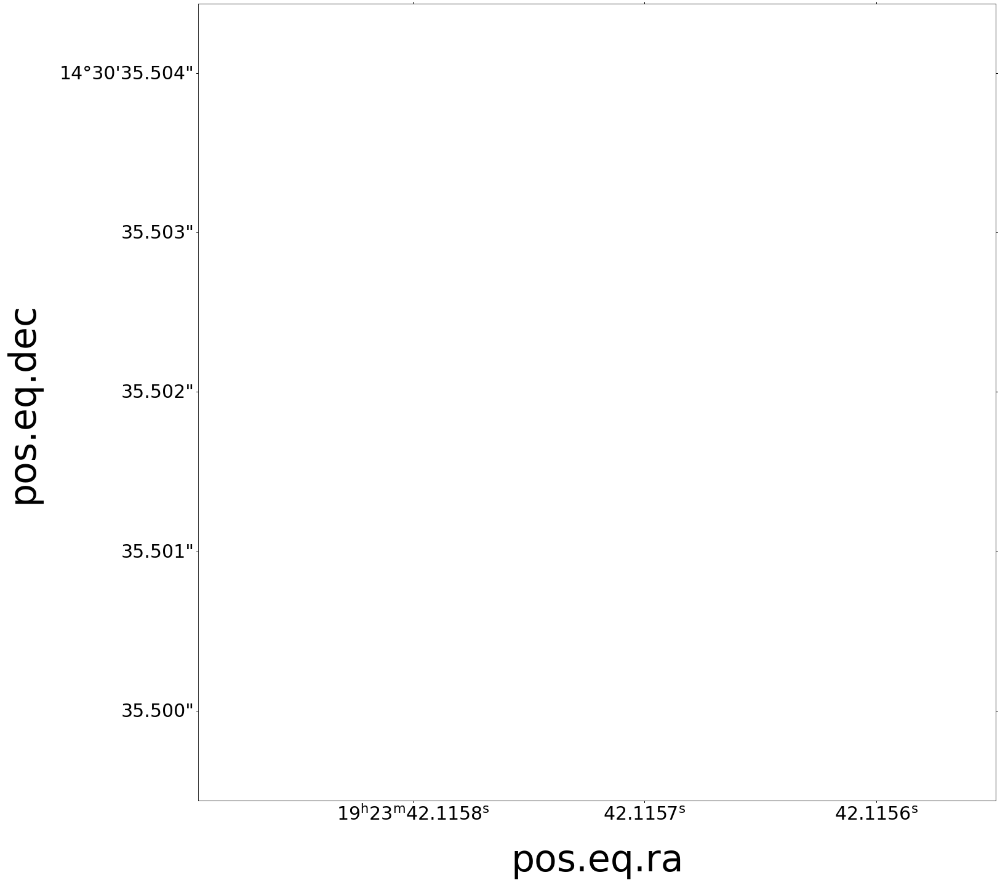

In [22]:
hdrNB3 = fits.getheader(w51n_b6_briggs)  
wcsNB3 = WCS(hdrNB3,naxis=2)
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)


hdrNB3 = fits.getheader(w51n_b6_almaimf)  
beamNB3_almaimf = Beam.from_fits_header(hdrNB3)
manualindex = [1, 2, 4, 5, 8, 10, 12, 13, 14, 15, 16, 19, 23, 25, 27, 28, 41]
w51e_b6_index = [i-1 for i in manualindex]
plot_aperture_on_image(ax1, w51n_b6_briggs, cat_w51e, beam_lr=beamNB3_almaimf, index=w51e_b6_index,
                      vmin=-0.00033771750497467836,vmax=0.0025052050426874256)
ax1.set_xlim(4200,7500)
ax1.set_ylim(260,7500)

In [ ]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51e_b6_almaimf)
hdrNB6 = fits.getheader(w51e_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]

beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.00110023576011658,vmax=0.008559992119315504)
afwhm_b6 = catdata_w51e['AFWHM02']
bfwhm_b6 = catdata_w51e['BFWHM02']
pixpos = wcsNB6.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(pixpos)):
    major = afwhm_b6[i]/3600/scaleNB6.value
    minor = bfwhm_b6[i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-beamNB6.pa.value,edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
for i in range(len(rec_ind)):
    major = afwhm_b6[rec_ind][i]/3600/scaleNB6.value
    minor = bfwhm_b6[rec_ind][i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[rec_ind][i],width=major,height=minor,facecolor='none',angle=180-beamNB6.pa.value,edgecolor='r',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind][i][0]-5,pixpos[rec_ind][i][1]+5,"#%d"%no[rec_ind][i],color='w',clip_on=True,fontsize=30)





1.041666666667e-05 deg



(2050.0, 2750.0)

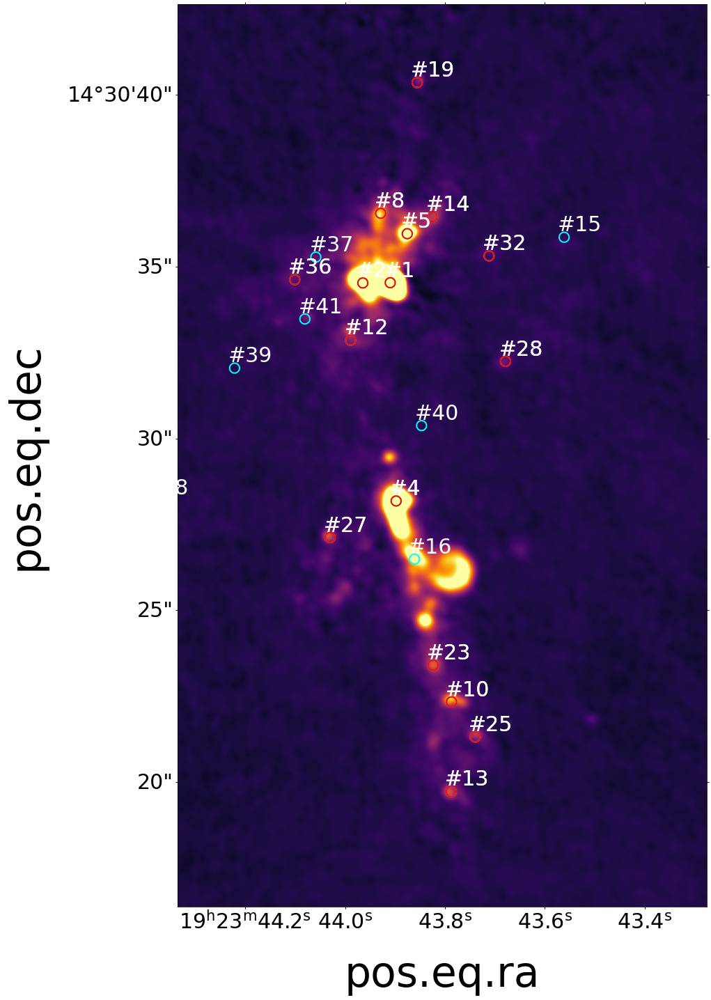

In [23]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b3 = fits.open(w51e_b3_almaimf)
hdrNB3 = fits.getheader(w51e_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]

beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.00110023576011658,vmax=0.008559992119315504)

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(pixpos)):
    major = beamNB3.major.value/scaleNB3.value
    minor = beamNB3.major.value/scaleNB3.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-beamNB3.pa.value,edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
for i in range(len(rec_ind_b3)):
    major = beamNB3.major.value/scaleNB3.value
    minor = beamNB3.major.value/scaleNB3.value

    ellipse = Ellipse(pixpos[rec_ind_b3][i],width=major,height=minor,facecolor='none',angle=180-beamNB3.pa.value,edgecolor='r',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b3][i][0]-5,pixpos[rec_ind_b3][i][1]+5,"#%d"%no[rec_ind_b3][i],color='w',clip_on=True,fontsize=30)


ax1.set_xlim(2340,2750)
ax1.set_ylim(2050,2750)




In [24]:
def count_source_in_image(image, xpix, ypix, kind='center'):
    nsource = len(xpix)
    isinside = []
    if kind is 'center':
        for i in range(nsource):
            try:
                isinside.append(np.isfinite(image[int(xpix[i]),int(ypix[i])]))
            except:
                isinside.append([False])
    
    return isinside

def plot_catalog_on_image(ax,image,hdrNB,catdatadir,isb3=True,beam=None,use_criteria=True, 
                          label=None,color='cyan',lw=2,aperture='fwhm+beam',xysource=None,offset=0):
    catdata = ascii.read(catdatadir,data_start=0,format='commented_header', header_start=120,  comment="!")
    sky_ra = catdata['WCS_ACOOR']
    sky_dec = catdata['WCS_DCOOR']
    no = catdata['NO']
    if isb3:
        bandlabel = '03'
    else:
        bandlabel = '02'
    fooa = catdata['FOOA%s'%bandlabel]
    foob = catdata['FOOB%s'%bandlabel]
    theta = catdata['THETA%s'%bandlabel]
    afwhm = catdata['AFWHM%s'%bandlabel]
    bfwhm = catdata['BFWHM%s'%bandlabel]
   
    if use_criteria and label is None:
        """
        rec_ind = np.where((np.abs(catdata['GOODM%s'%bandlabel])>1)&
                   (np.abs(catdata['SIGNM%s'%bandlabel])>1)&
                   (catdata['FXP_BST%s'%bandlabel]/catdata['FXP_ERR%s'%bandlabel]>2)&
                   (catdata['FXT_BST%s'%bandlabel]/catdata['FXT_ERR%s'%bandlabel]>2)&
                   (catdata['AFWHM%s'%bandlabel]/catdata['BFWHM%s'%bandlabel]<2)&
                   (catdata['FOOA%s'%bandlabel]/catdata['AFWHM%s'%bandlabel]>1.15))[0]
        """
        rec_ind = np.where((np.abs(catdata['GOODM03'])>1)&
                   (np.abs(catdata['SIGNM03'])>1)&
                   (catdata['FXP_BST03']/catdata['FXP_ERR03']>2)&
                   (catdata['FXT_BST03']/catdata['FXT_ERR03']>2)&
                   (catdata['AFWHM03']/catdata['BFWHM03']<2)&
                   (catdata['FOOA03']/catdata['AFWHM03']>1.15) &
                   (np.abs(catdata['GOODM02'])>1) &
                   (np.abs(catdata['SIGNM02'])>1)&
                   (catdata['FXP_BST02']/catdata['FXP_ERR02']>2)&
                   (catdata['FXT_BST02']/catdata['FXT_ERR02']>2)&
                   (catdata['AFWHM02']/catdata['BFWHM02']<2)&
                   (catdata['FOOA02']/catdata['AFWHM02']>1.15))[0]

        print('rec_ind',rec_ind)
        sky_ra= sky_ra[rec_ind]
        sky_dec = sky_dec[rec_ind]
        fooa = fooa[rec_ind]
        foob = foob[rec_ind]
        theta = theta[rec_ind]
        no = no[rec_ind]
        afwhm = afwhm[rec_ind]
        bfwhm = bfwhm[rec_ind]
        
    
    if label is not None:
        label = [i-1 for i in label]
        sky_ra= sky_ra[label]
        sky_dec = sky_dec[label]
        fooa = fooa[label]
        foob = foob[label]
        theta = theta[label]
        no = no[label]
        afwhm = afwhm[label]
        bfwhm = bfwhm[label]

    skypos = np.vstack((sky_ra,sky_dec)).T

    
    wcsNB = WCS(hdrNB,naxis=2)
    scaleNB = wcsNB.proj_plane_pixel_scales()[0]
    beamNB = Beam.from_fits_header(hdrNB)


    image = fitsdata[0].data[0][0]
    ax1.imshow(image, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.000103489713773963128,vmax=0.0022162524723021867)

    xypos = wcsNB.wcs_world2pix(skypos,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    
        
    
    for i in range(len(xypos)):
        if aperture is 'footprint':
            major = fooa[i]/3600/scaleNB.value
            minor = foob[i]/3600/scaleNB.value
            pa = 180-theta[i]
        elif aperture is 'fwhm+beam':
            meanbeamsize = (beam.major.value+beam.minor.value)/4
            major = (afwhm[i]/3600+meanbeamsize)/scaleNB.value
            minor = (bfwhm[i]/3600+meanbeamsize)/scaleNB.value
            pa = 180-theta[i]
        elif aperture is 'beam':
            major = beam.major.value/scaleNB.value
            minor = beam.minor.value/scaleNB.value
            pa = 180-beam.pa.value

        ellipse = Ellipse(xypos[i],width=major+offset,height=minor+offset,facecolor='none',
                          angle=pa,edgecolor=color,lw=lw)
        if xysource is not None:
            numsource, indsource = count_points_in_ellipse(xpos[i],ypos[i],major,minor,pa,xysource[:,0],xysource[:,1])
            ax.text(xpos[i]+10,ypos[i]+10,'%d'%numsource,color='w',fontsize=30,clip_on=True)
        ax.add_patch(ellipse)
        
xysky = np.vstack((sky_ra,sky_dec)).T
fitsdata_highres = fits.open(w51e_b6_briggs)
image_highres = fitsdata_highres[0].data[0][0]
hdrNB_highres = fits.getheader(w51e_b6_briggs)  
wcsNB_highres = WCS(hdrNB_highres,naxis=2)
pixpos = wcsNB_highres.wcs_world2pix(skypos,0)
xpos = pixpos[:,0] ; ypos = pixpos[:,1]
ind_image = count_source_in_image(image_highres, xpos, ypos) # find the number of sources for the image with the smallest sky coverage (overlapped region)
print('the number of total alma-imf sources within the image = ', len(ind_image))
plot_catalog_on_image(ax1,image_highres,hdrNB_highres,cat_w51e ,isb3=False,beam=beamNB3,use_criteria=False, 
                          label=ind_image,color='w',lw=2,aperture='fwhm+beam',xysource=None,offset=2)

ind_image_rec = np.intersect1d(ind_image, ind_rec)
plot_catalog_on_image(ax1,image_highres,hdrNB_highres,cat_w51e ,isb3=False,beam=beamNB3,use_criteria=False, 
                          label=ind_image_rec,color='cyan',lw=2,aperture='fwhm+beam',xysource=None,offset=1)
print('the number of alma-imf sources within the image using the recommend criteria = ', len(ind_image_sec))

ind_manual = []
plot_catalog_on_image(ax1,image_highres,hdrNB_highres,cat_w51e ,isb3=False,beam=beamNB3,use_criteria=False, 
                          label=ind_image_rec,color='lime',lw=2,aperture='fwhm+beam',xysource=None)
pixpos2 = wcsNB3.wcs_world2pix(skypos,0)


  
    

the number of total alma-imf sources within the image =  41


TypeError: unsupported operand type(s) for -: 'list' and 'int'

1.041666666667e-05 deg

2383.223004715898 2700.554139760846
2433.3400098211105 2713.341487948183


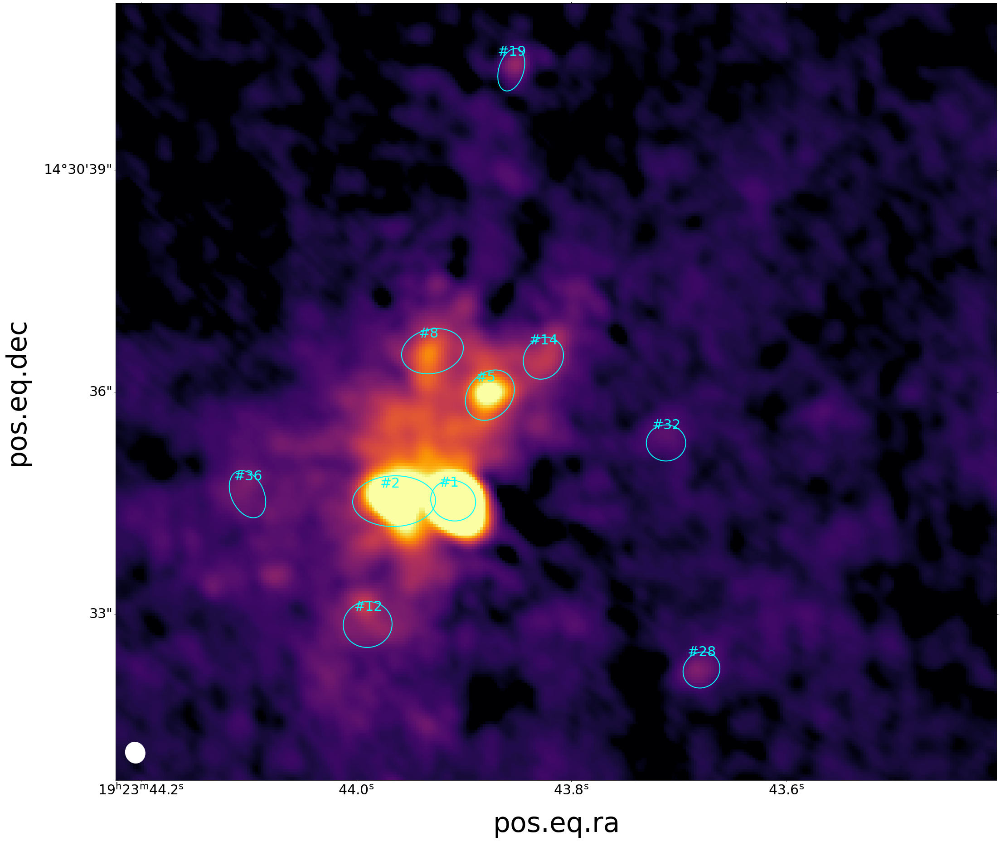

In [25]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b3 = fits.open(w51e_b3_almaimf)
hdrNB3 = fits.getheader(w51e_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=0,vmax=0.014897594877392159))

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(rec_ind_b3)):
    major = asize_b3[rec_ind_b3][i]/3600/scaleNB3.value
    minor = bsize_b3[rec_ind_b3][i]/3600/scaleNB3.value

    ellipse = mpl.patches.Ellipse(pixpos[rec_ind_b3][i],width=major,height=minor,facecolor='none',angle=theta_b3[rec_ind_b3][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b3][i][0]-5,pixpos[rec_ind_b3][i][1]+5,"#%d"%no[rec_ind_b3][i],color='cyan',clip_on=True,fontsize=30)

sky1 = coordinates.SkyCoord(290.93426385, 14.50854166, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.93084939, 14.51145832, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)
print(pix1[0],pix2[0])
print(pix1[1],pix2[1])

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

plt.savefig('w51e2_almaimf_b3.png')
plt.show()


1.041666666667e-05 deg



(2050.0, 2700.0)

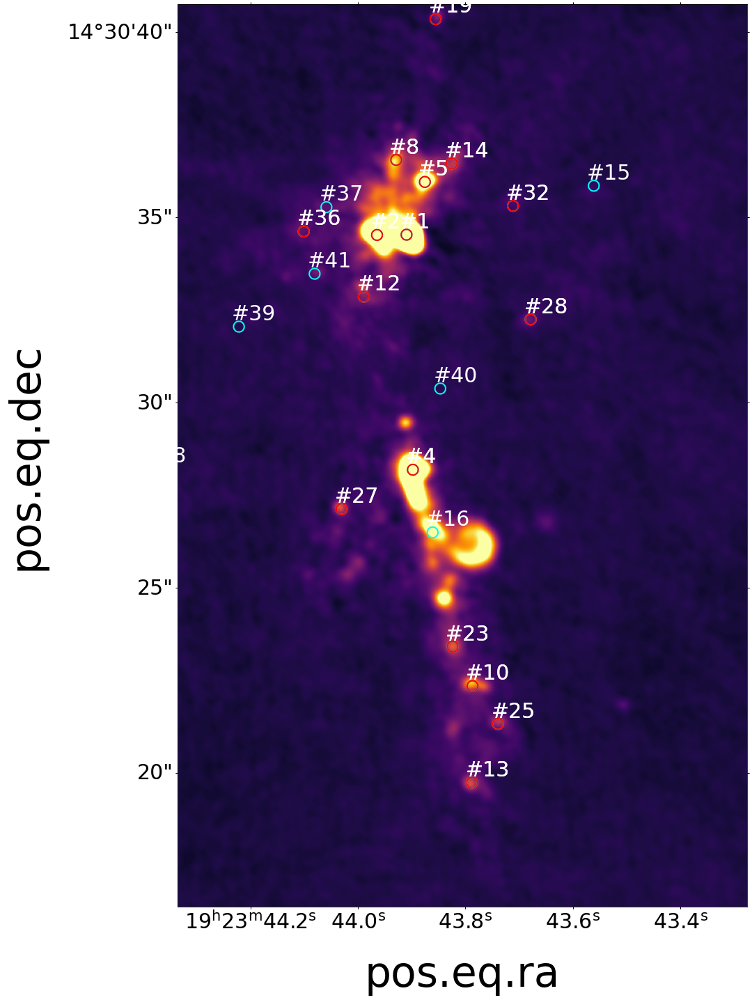

In [26]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b3 = fits.open(w51e_b3_almaimf)
hdrNB3 = fits.getheader(w51e_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]

beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.00110023576011658,vmax=0.008559992119315504)

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(pixpos)):
    major = beamNB3.major.value/scaleNB3.value
    minor = beamNB3.major.value/scaleNB3.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=180-beamNB3.pa.value,edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='w',clip_on=True,fontsize=30)
for i in range(len(rec_ind_b3)):
    major = beamNB3.major.value/scaleNB3.value
    minor = beamNB3.major.value/scaleNB3.value

    ellipse = Ellipse(pixpos[rec_ind_b3][i],width=major,height=minor,facecolor='none',angle=180-beamNB3.pa.value,edgecolor='r',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b3][i][0]-5,pixpos[rec_ind_b3][i][1]+5,"#%d"%no[rec_ind_b3][i],color='w',clip_on=True,fontsize=30)


ax1.set_xlim(2340,2750)
ax1.set_ylim(2050,2700)




1.041666666667e-05 deg

2383.223683665967 2700.556240659578
2116.007209946002 2433.3421281206583


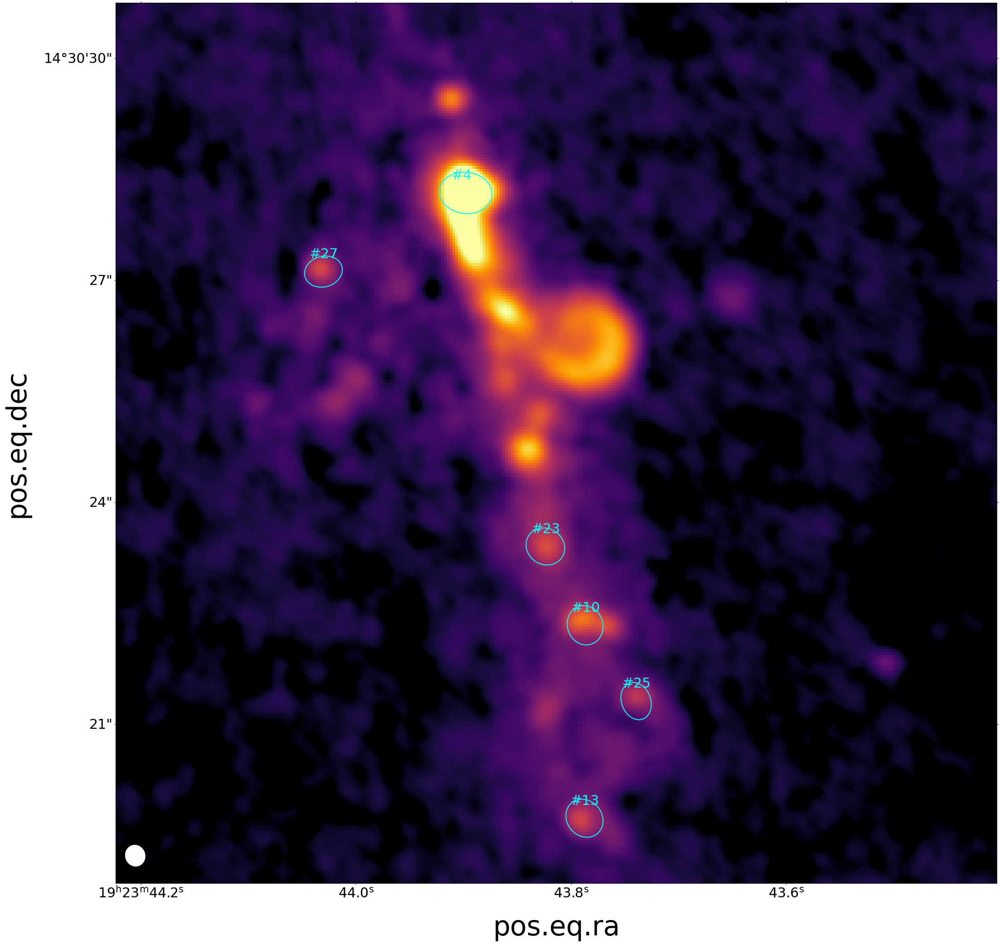

In [27]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b3 = fits.open(w51e_b3_almaimf)
hdrNB3 = fits.getheader(w51e_b3_almaimf)  
wcsNB3 = WCS(hdrNB3,naxis=2)
scaleNB3 = wcsNB3.proj_plane_pixel_scales()[0]
beamNB3 = Beam.from_fits_header(hdrNB3)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB3)
imageb3 = fitsdata_b3[0].data[0][0]
ax1.imshow(imageb3, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=0,vmax=0.014897594877392159))

pixpos = wcsNB3.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(rec_ind_b3)):
    major = asize_b3[rec_ind_b3][i]/3600/scaleNB3.value
    minor = bsize_b3[rec_ind_b3][i]/3600/scaleNB3.value

    ellipse = Ellipse(pixpos[rec_ind_b3][i],width=major,height=minor,facecolor='none',angle=theta_b3[rec_ind_b3][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b3][i][0]-5,pixpos[rec_ind_b3][i][1]+5,"#%d"%no[rec_ind_b3][i],color='cyan',clip_on=True,fontsize=30)

    
sky1 = coordinates.SkyCoord(290.93426384, 14.50523611, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.93084941, 14.50854166, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB3.world_to_pixel(sky1)
pix2 = wcsNB3.world_to_pixel(sky2)
print(pix1[0],pix2[0])
print(pix1[1],pix2[1])

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

plt.savefig('w51e8_almaimf_b3.png')
plt.show()


949.5143779469743 1147.8463373502586
991.1527961388533 1166.153719934365


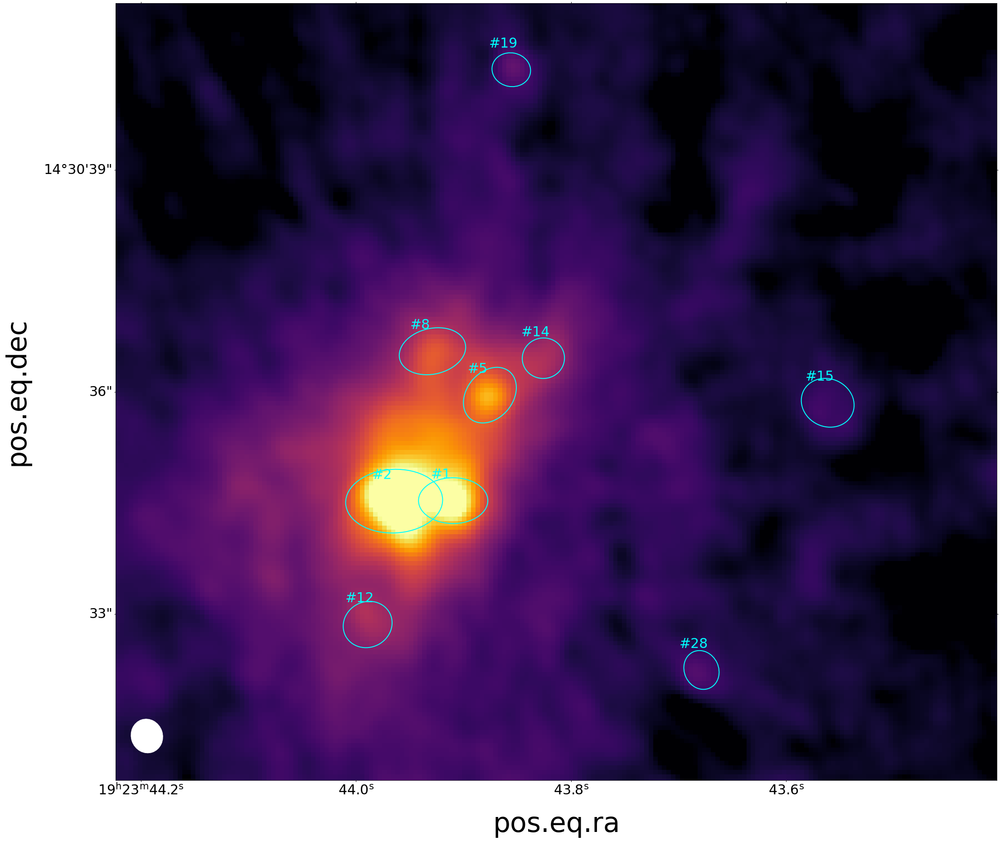

In [28]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51e_b6_almaimf)
hdrNB6 = fits.getheader(w51e_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]
beamNB6 = Beam.from_fits_header(hdrNB6)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
          norm=colors.PowerNorm(gamma=0.5,vmin=0,vmax=0.1971662586564468))

pixpos = wcsNB6.wcs_world2pix(skypos,0)

for i in range(len(rec_ind_b6)):
    major = asize_b6[rec_ind_b6][i]/3600/scaleNB6.value
    minor = bsize_b6[rec_ind_b6][i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[rec_ind_b6][i],width=major,height=minor,facecolor='none',angle=theta_b6[rec_ind_b6][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b6][i][0]-5,pixpos[rec_ind_b6][i][1]+5,"#%d"%no[rec_ind_b6][i],color='cyan',clip_on=True,fontsize=30)

    
sky1 = coordinates.SkyCoord(290.93426385, 14.50854166, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB6).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.93084939, 14.51145832, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB6).name,unit=(u.deg,u.deg))
pix1 = wcsNB6.world_to_pixel(sky1)
pix2 = wcsNB6.world_to_pixel(sky2)
print(pix1[0],pix2[0])
print(pix1[1],pix2[1])

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])
add_beam(ax1, pix1[0]+7, pix1[1]+10, beamNB3, scaleNB3)

plt.savefig('w51e2_almaimf_b6.png')
plt.show()


1.041666666667e-05 deg

949.5148022912152 1147.8476504132263
792.8197962029271 991.1541200596898


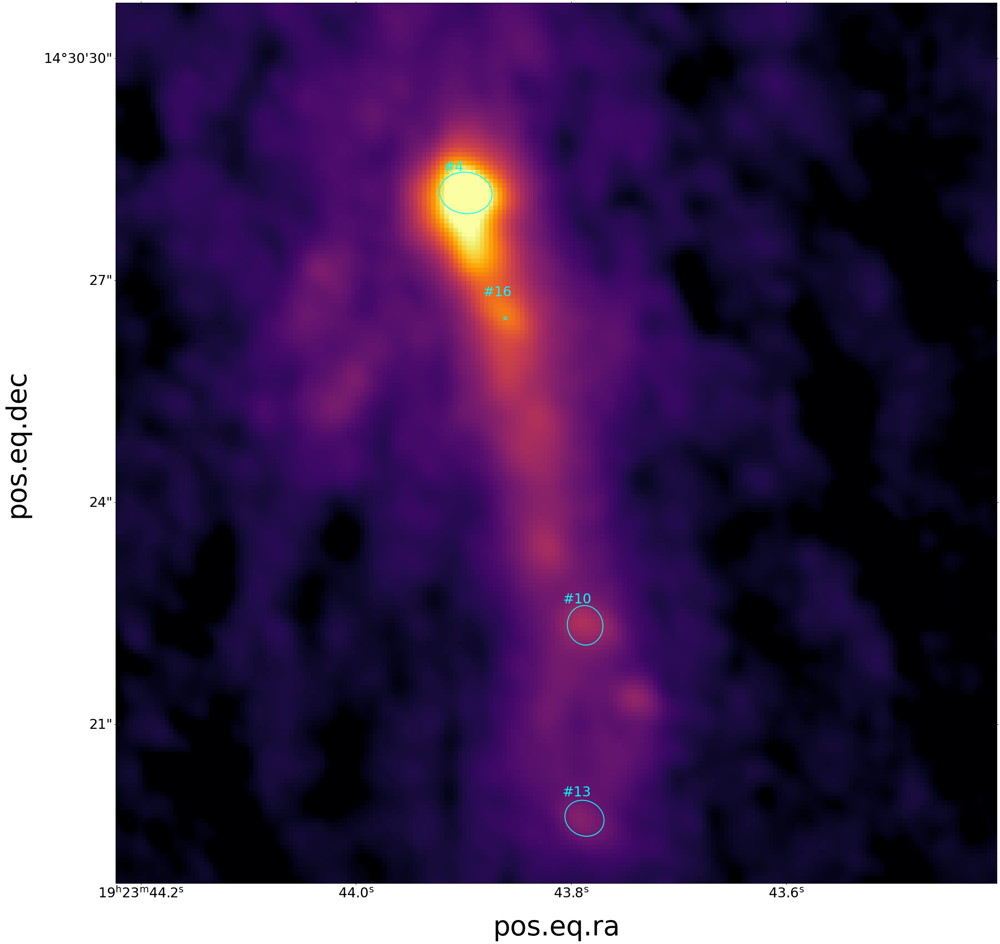

In [29]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51e_b6_almaimf)
hdrNB6 = fits.getheader(w51e_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),
           norm=colors.PowerNorm(gamma=0.5,vmin=0,vmax=0.19716625865644689))

pixpos = wcsNB6.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(rec_ind_b6)):
    major = asize_b3[rec_ind_b6][i]/3600/scaleNB6.value
    minor = bsize_b3[rec_ind_b6][i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[rec_ind_b6][i],width=major,height=minor,facecolor='none',angle=theta_b6[rec_ind_b6][i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[rec_ind_b6][i][0]-5,pixpos[rec_ind_b6][i][1]+5,"#%d"%no[rec_ind_b6][i],color='cyan',clip_on=True,fontsize=30)

    
sky1 = coordinates.SkyCoord(290.93426384, 14.50523611, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.93084941, 14.50854166, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))
pix1 = wcsNB6.world_to_pixel(sky1)
pix2 = wcsNB6.world_to_pixel(sky2)
print(pix1[0],pix2[0])
print(pix1[1],pix2[1])

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])

plt.savefig('w51e8_almaimf_b6.png')
plt.show()


1.041666666667e-05 deg

949.5143779469743 1147.8463373502586
991.1527961388533 1166.153719934365


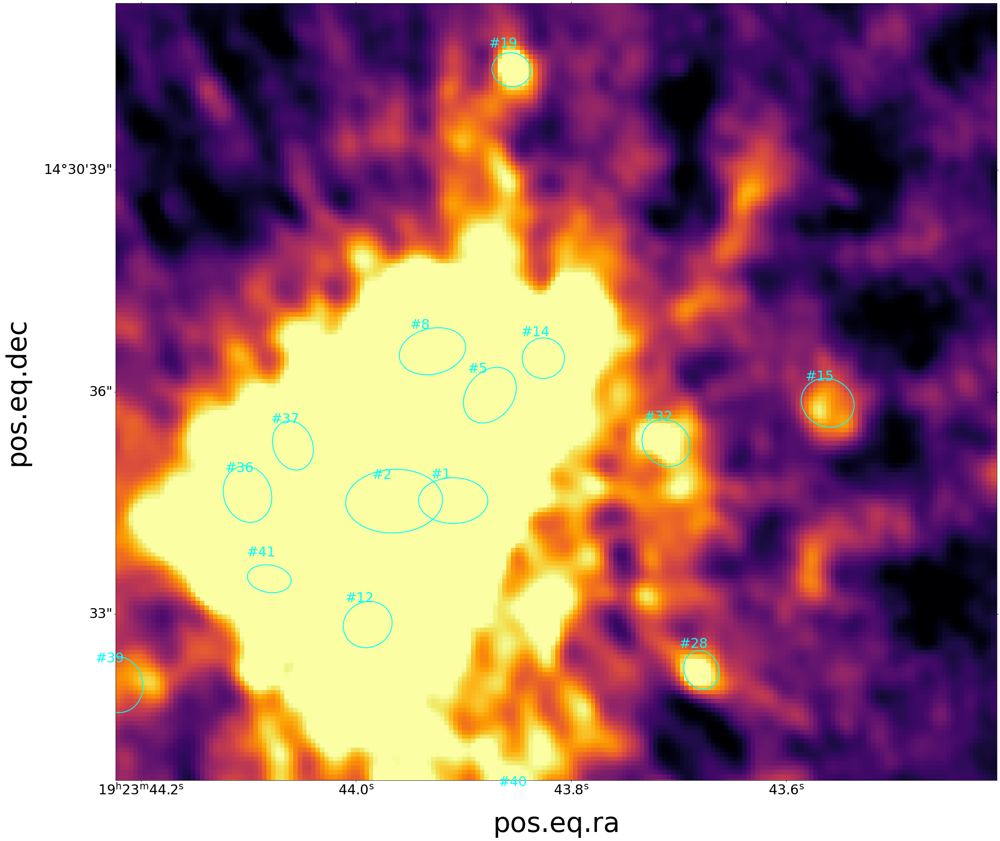

In [30]:
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.titlesize']=60
import matplotlib as mpl 
import matplotlib.cm as cm
import matplotlib.colors
from matplotlib.patches import Rectangle, Ellipse

fitsdata_b6 = fits.open(w51e_b6_almaimf)
hdrNB6 = fits.getheader(w51e_b6_almaimf)  
wcsNB6 = WCS(hdrNB6,naxis=2)
scaleNB6 = wcsNB6.proj_plane_pixel_scales()[0]

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB6)
imageb6 = fitsdata_b6[0].data[0][0]
ax1.imshow(imageb6, origin='lower',cmap=plt.get_cmap('inferno'),vmin=-0.00110023576011658,vmax=0.008559992119315504)

pixpos = wcsNB6.wcs_world2pix(skypos,0)
print(scaleNB3)
print()
for i in range(len(asize_b6)):
    major = asize_b6[i]/3600/scaleNB6.value
    minor = bsize_b6[i]/3600/scaleNB6.value

    ellipse = Ellipse(pixpos[i],width=major,height=minor,facecolor='none',angle=theta_b6[i]*(-1),edgecolor='cyan',lw=2)
    ax1.add_patch(ellipse)
    ax1.text(pixpos[i][0]-5,pixpos[i][1]+5,"#%d"%no[i],color='cyan',clip_on=True,fontsize=30)

    
sky1 = coordinates.SkyCoord(290.93426385, 14.50854166, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB6).name,unit=(u.deg,u.deg))
sky2 = coordinates.SkyCoord(290.93084939, 14.51145832, 
                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB6).name,unit=(u.deg,u.deg))
pix1 = wcsNB6.world_to_pixel(sky1)
pix2 = wcsNB6.world_to_pixel(sky2)
print(pix1[0],pix2[0])
print(pix1[1],pix2[1])

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])

#plt.savefig('w51e2_almaimf_b6.png')
plt.show()
